# 0 Setup

In [ ]:
!pip install --upgrade -q gspread
!pip install glasbey

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 60.0/60.0 kB 3.2 MB/s eta 0:00:00


In [141]:
# import pandas
import gspread
import pandas as pd
import numpy as np
import seaborn as sns
import copy
from collections import Counter
from scipy import stats
import glasbey

# Initialize a Counter from a list
my_list = ['a', 'b', 'a', 'c', 'b', 'a']
count_list = Counter(my_list)

from google.colab import auth
from google.auth import default

import matplotlib as mpl
mpl.rcParams['figure.dpi'] = 200

In [142]:
count_list

Counter({'a': 3, 'b': 2, 'c': 1})

In [143]:
import matplotlib.pyplot as plt

In [144]:
# bar_plattee = sns.color_palette("Paired")
# bar_plattee = sns.color_palette("Set2")
bar_plattee = glasbey.create_palette(palette_size=17, colorblind_safe=True, cvd_severity=100)
bar_plattee

['#4171ff',
 '#c61c00',
 '#0400fb',
 '#ffc200',
 '#f341a2',
 '#791059',
 '#5d0000',
 '#102da2',
 '#20ebff',
 '#49be61',
 '#3d7555',
 '#f335e7',
 '#142045',
 '#cee3a2',
 '#b6009e',
 '#391c24',
 '#a2d2c6']

In [145]:
def group_by_task(data, sth2metric_dict, calculating_group = False):
    data_copy = copy.deepcopy(data)
    score_sns_df = []
    for sth in sth2metric_dict:
        tmp_col_lst = [col for col in sth2metric_dict[sth] if col in data_copy.columns]
        if len(tmp_col_lst) == 0: continue

        # merge metrics from the same task first
        if calculating_group:
            tmp_col_tasks = [col.split('-')[0] for col in tmp_col_lst]
            tmp_counter = dict(Counter(tmp_col_tasks))
            new_tmp_col_lst = []
            for task in tmp_counter:
                if tmp_counter[task] == 1:
                    for col in tmp_col_lst:
                        if task + '-' in col:
                            new_tmp_col_lst.append(col)
                            break
                else:
                    tmp_col_bin = []
                    for col in tmp_col_lst:
                        if task + '-' in col:
                            tmp_col_bin.append(col)
                    data_copy[task + '-avg'] = data_copy[tmp_col_bin].mean(axis = 1)
                    new_tmp_col_lst.append(task + '-avg')
            # print("tmp_col_lst:", tmp_col_lst)
            # print("new_tmp_col_lst:", new_tmp_col_lst)
        else:
            new_tmp_col_lst = tmp_col_lst

        # find a subset, and then take row-level mean
        tmp_score_ndarray = data_copy[new_tmp_col_lst]
        data_copy[sth] = tmp_score_ndarray.mean(axis = 1)
    return data_copy

def stack_data_for_sns(data, repeat_cols, stack_cols, stack_col_name, group_col_name):

    stacked_df = []
    for col in stack_cols:
        tmp_df = copy.deepcopy(data[repeat_cols + [col]]).rename(
            columns = {
                col: stack_col_name
            }
        )
        tmp_df[group_col_name] = col
        stacked_df.append(tmp_df)
    stacked_df = pd.concat(stacked_df).reset_index(drop = True)
    return stacked_df

def convert_floats(x):
    if isinstance(x, str):
        try:
            return float(x)
        except:
            return 0
    return x

# 1 Load in data

In [ ]:
auth.authenticate_user()
creds, _ = default()

def read_result_df(subset = 'regular'):
    gc = gspread.authorize(creds)
    # sh = gc.open_by_url("Insert Sheet URL here")
    sh = gc.open_by_key("") # put google drive key here!
    worksheet = sh.worksheet("Results")
    rows = worksheet.get_all_values()

    results_df = pd.DataFrame.from_records(rows)
    results_df.columns = results_df.iloc[0]
    if subset == 'regular':
        return copy.deepcopy(results_df.iloc[1:18])
    elif subset == 'tmp_var':
        return copy.deepcopy(results_df.iloc[20:30])
    elif subset == 'sft':
        return copy.deepcopy(results_df.iloc[31:34])

In [147]:
results_df = read_result_df()
results_df

,model,size,type,family,Knowledge Cutoff Date,Release Date,date,short name,aut-best_avg_rating,ttcw-fluency_narrative_ending,...,ttct-fluency,ttct-originality,neocoder-convergent@0,neocoder-convergent@5,neocoder-divergent@5,neocoder-divergent@0,,,Neocoder-divergent,Neocoder-convergent
1,Mistral-7B-Instruct-v0.3,7B,open,Mistral,05/22/2024,05/22/2024,358,Mistral-7B,0.718,0.17,...,0.766,0.7279,0,0,1,0.9949,,,"[0.9949, 0.9899, 1.0, 0.9948, 0.9886, 1.0]","[0, 0, 0, 0, 0, 0]"
2,Qwen2.5-7B-Instruct,7B,open,Qwen,,2024-09-19,238,Qwen2.5-7B,0.602,0.08,...,0.7666,0.7181,0.0202,0,0.9158,0.8485,,,"[0.8485, 0.8371, 0.8528, 0.8705, 0.8457, 0.9158]","[0.0202, 0.0051, 0, 0, 0, 0]"
3,OLMo-2-1124-7B-Instruct,7B,open,Olmo,,November 2024,170,OLMo2-7B,0.624,0.75,...,0.7024,0.6795,0,0,0.5773,0.649,,,"[0.6490, 0.6869, 0.7107, 0.6010, 0.7029, 0.5773]","[0, 0, 0, 0, 0, 0]"
4,Llama-3.1-8B-Instruct,8B,open,Llama,"December 1, 2023","July 23, 2024",296,Llama3.1-8B,0.632,0,...,0.7203,0.6981,0.0051,0,0.9845,0.996,,,"[0.9960, 0.9975, 0.9904, 0.9948, 0.9857, 0.9845]","[0.0051, 0, 0, 0, 0, 0]"
5,OLMo-2-1124-13B-Instruct,13B,open,Olmo,,November 2024,170,OLMo2-13B,0.69,0.67,...,0.627,0.6142,0.0051,0,0.4433,0.5303,,,"[0.5303, 0.5051, 0.5025, 0.4870, 0.4914, 0.4433]","[0.0051, 0, 0, 0, 0, 0]"
6,Mistral-Small-24B-Instruct-2501,24B,open,Mistral,NA,2025-01-31,104,Mistral-24B,0.604,0.25,...,0.7064,0.6842,0,0,0.9897,0.9848,,,"[0.9848484848484849, 0.9848484848484849, 0.989...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0]"
7,Qwen2.5-32B-Instruct,32B,open,Qwen,,2024-09-19,238,Qwen2.5-32B,0.674,0,...,0.7727,0.7304,0.0051,0,0.3402,0.2778,,,"[0.2777777777777778, 0.29292929292929293, 0.32...","[0.005050505050505051, 0.0, 0.0, 0.0, 0.0, 0.0]"
8,Mixtral-8x7B-Instruct-v0.1,56B,open,Mistral,NA,"December 11, 2023",521,Mixtral-8x7B,0.708,0.17,...,0.734,0.6712,0.0253,0,0.9897,0.9747,,,"[0.9747474747474747, 0.9886363636363636, 0.994...","[0.025252525252525252, 0.0, 0.0, 0.00518134715..."
9,Llama-3.3-70B-Instruct,70B,open,Llama,December 2023,December 2024,160,Llama3.3-70B,0.69,0,...,0.7664,0.7341,0.1515,0,1,1,,,"[1.0, 1.0, 1.0, 0.9948186528497409, 0.99428571...","[0.15151515151515152, 0.04040404040404041, 0.0..."
10,Qwen2.5-72B-Instruct,72B,open,Qwen,,2024-09-19,238,Qwen2.5-72B,0.636,0.42,...,0.7704,0.7301,0,0,0.7938,0.8485,,,"[0.8484848484848485, 0.7929292929292929, 0.796...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0]"


In [148]:
results_df.columns

Index(['model', 'size', 'type', 'family', 'Knowledge Cutoff Date',
       'Release Date', 'date', 'short name', 'aut-best_avg_rating',
       'ttcw-fluency_narrative_ending',
       'ttcw-fluency_understandability_coherence',
       'ttcw-flexibility_emotional_flexibility',
       'ttcw-elaboration_world_building_setting', 'dat-dat_score',
       'creativity_index-l_uniqueness', 'creative_short-avg_sur',
       'creative_short-avg_ngram', 'creative_short-novelty',
       'cs4-coherence_39', 'cs4-const_sati_39', 'cs4-quc_39',
       'cs4-rcs_7_39(neg)', 'cs4-n_diversity_39',
       'creative_math-correctness_ratio', 'creative_math-novelty_ratio',
       'ttct-elaboration', 'ttct-flexibility', 'ttct-fluency',
       'ttct-originality', 'neocoder-convergent@0', 'neocoder-convergent@5',
       'neocoder-divergent@5', 'neocoder-divergent@0', '', '',
       'Neocoder-divergent', 'Neocoder-convergent'],
      dtype='object', name=0)

In [149]:
metric2group = {
    'aut-best_avg_rating': "novelty",
    'ttcw-fluency_narrative_ending': "quality",
    'ttcw-fluency_understandability_coherence': "quality",
    'ttcw-flexibility_emotional_flexibility': "diversity",
    'ttcw-elaboration_world_building_setting': "quality",
    'dat-dat_score': "diversity",
    'creativity_index-l_uniqueness': "novelty",
    'creative_short-avg_sur': "novelty",
    'creative_short-avg_ngram': "diversity",
    'creative_short-novelty': "novelty",
    'cs4-coherence_39': "quality",
    # 'cs4-const_sati_39': "quality",
    'cs4-quc_39': "quality",
    'cs4-rcs_7_39(neg)': "novelty",
    'cs4-n_diversity_39': "diversity",
    'creative_math-correctness_ratio': "quality",
    'creative_math-novelty_ratio': "novelty",
    'ttct-elaboration': "quality",
    'ttct-flexibility': "diversity",
    'ttct-fluency': "quality",
    'ttct-originality': "novelty",
    'neocoder-convergent@0': "quality",
    'neocoder-convergent@5': "quality",
    'neocoder-divergent@5': "novelty",
    'neocoder-divergent@0': "novelty"
}
group2metric = {
    str(k): [metric for metric in metric2group if metric2group[metric] == k]
    for k in np.unique(list(metric2group.values()))
}
group2metric

{'diversity': ['ttcw-flexibility_emotional_flexibility',
  'dat-dat_score',
  'creative_short-avg_ngram',
  'cs4-n_diversity_39',
  'ttct-flexibility'],
 'novelty': ['aut-best_avg_rating',
  'creativity_index-l_uniqueness',
  'creative_short-avg_sur',
  'creative_short-novelty',
  'cs4-rcs_7_39(neg)',
  'creative_math-novelty_ratio',
  'ttct-originality',
  'neocoder-divergent@5',
  'neocoder-divergent@0'],
 'quality': ['ttcw-fluency_narrative_ending',
  'ttcw-fluency_understandability_coherence',
  'ttcw-elaboration_world_building_setting',
  'cs4-coherence_39',
  'cs4-quc_39',
  'creative_math-correctness_ratio',
  'ttct-elaboration',
  'ttct-fluency',
  'neocoder-convergent@0',
  'neocoder-convergent@5']}

In [150]:
metric2task = {
    'aut-best_avg_rating': "aut",
    'ttcw-fluency_narrative_ending': "ttcw",
    'ttcw-fluency_understandability_coherence': "ttcw",
    'ttcw-flexibility_emotional_flexibility': "ttcw",
    'ttcw-elaboration_world_building_setting': "ttcw",
    'dat-dat_score': "dat",
    'creativity_index-l_uniqueness': "creativity_index",
    'creative_short-avg_sur': "creative_short",
    'creative_short-avg_ngram': "creative_short",
    'creative_short-novelty': "creative_short",
    'cs4-coherence_39': "cs4",
    'cs4-quc_39': "cs4",
    'cs4-rcs_7_39(neg)': "cs4",
    'cs4-n_diversity_39': "cs4",
    'creative_math-correctness_ratio': "creative_math",
    'creative_math-novelty_ratio': "creative_math",
    'ttct-elaboration': "ttct",
    'ttct-flexibility': "ttct",
    'ttct-fluency': "ttct",
    'ttct-originality': "ttct",
    'neocoder-convergent@0': "neocoder",
    'neocoder-convergent@5': "neocoder",
    'neocoder-divergent@5': "neocoder",
    'neocoder-divergent@0': "neocoder"
}
task2metric = {
    str(k): [metric for metric in metric2task if metric2task[metric] == k]
    for k in np.unique(list(metric2task.values()))
}
task2metric

{'aut': ['aut-best_avg_rating'],
 'creative_math': ['creative_math-correctness_ratio',
  'creative_math-novelty_ratio'],
 'creative_short': ['creative_short-avg_sur',
  'creative_short-avg_ngram',
  'creative_short-novelty'],
 'creativity_index': ['creativity_index-l_uniqueness'],
 'cs4': ['cs4-coherence_39',
  'cs4-quc_39',
  'cs4-rcs_7_39(neg)',
  'cs4-n_diversity_39'],
 'dat': ['dat-dat_score'],
 'neocoder': ['neocoder-convergent@0',
  'neocoder-convergent@5',
  'neocoder-divergent@5',
  'neocoder-divergent@0'],
 'ttct': ['ttct-elaboration',
  'ttct-flexibility',
  'ttct-fluency',
  'ttct-originality'],
 'ttcw': ['ttcw-fluency_narrative_ending',
  'ttcw-fluency_understandability_coherence',
  'ttcw-flexibility_emotional_flexibility',
  'ttcw-elaboration_world_building_setting']}

In [151]:
# results_df.family.apply(lambda m: m not in exclude_lst)

In [152]:
# tmp_lst = results_df['Neocoder-divergent'].apply(lambda lst: eval(lst)[0]).round(4)
# for i in tmp_lst:
#     print(i)

In [ ]:
# results_df

# 2 PCA

In [ ]:
from sklearn.decomposition import PCA

In [ ]:
task_lst = [
    'ttcw',
    'aut',
    'creativity_index',
    'creative_short',
    'dat',
    'cs4',
    'creative_math',
    'neocoder',
    'ttct'
]
task_lst = [t+'-' for t in task_lst]
exclude_lst = [
    'creative_short-avg_3_gram'
]

# col_lst = ['model', 'Size', 'Family']
col_lst = []
for col in results_df.columns:
    for t in task_lst:
        if t in col and col not in exclude_lst:
            col_lst.append(col)
            break
# col_lst

tmp_result_df = results_df[col_lst].dropna()#.iloc[:13]
# tmp_result_df = tmp_result_df.loc[tmp_result_df]
tmp_result_df

,aut-best_avg_rating,ttcw-fluency_narrative_ending,ttcw-fluency_understandability_coherence,ttcw-flexibility_emotional_flexibility,ttcw-elaboration_world_building_setting,dat-dat_score,creativity_index-l_uniqueness,creative_short-avg_sur,creative_short-avg_ngram,creative_short-novelty,...,creative_math-correctness_ratio,creative_math-novelty_ratio,ttct-elaboration,ttct-flexibility,ttct-fluency,ttct-originality,neocoder-convergent@0,neocoder-convergent@5,neocoder-divergent@5,neocoder-divergent@0
1,0.718,0.17,0.08,0,0,0.7908,0.4496,0.0889,0.81,0.0109,...,0.2544,0.0296,0.7861,0.7757,0.766,0.7279,0,0,1,0.9949
2,0.602,0.08,0.17,0,0,0.6907,0.4354,0.0834,0.22,0.0126,...,0.7875,0.162,0.8073,0.7842,0.7666,0.7181,0.0202,0,0.9158,0.8485
3,0.624,0.75,0.25,0.17,0.08,0.8058,0.4810,0.0599,0.895,0.0163,...,0.3711,0.0453,0.7226,0.7159,0.7024,0.6795,0,0,0.5773,0.649
4,0.632,0,0.08,0.08,0,0.8208,0.4724,0.049,0.41,0.0133,...,0.5819,0.061,0.7831,0.7395,0.7203,0.6981,0.0051,0,0.9845,0.996
5,0.69,0.67,0.33,0.25,0.08,0.8133,0.4860,0.2043,0.905,0.0181,...,0.5087,0.115,0.654,0.6455,0.627,0.6142,0.0051,0,0.4433,0.5303
6,0.604,0.25,0.25,0,0,0.6004,0.4752,0.1406,0.82,0.0151,...,0.6899,0.2143,0.7556,0.7355,0.7064,0.6842,0,0,0.9897,0.9848
7,0.674,0,0.17,0,0,0.6919,0.4663,0.1263,0.87,0.0082,...,0.8972,0.2213,0.8199,0.7976,0.7727,0.7304,0.0051,0,0.3402,0.2778
8,0.708,0.17,0.08,0,0,0.8298,0.4149,0.0601,0.715,0.0109,...,0.5697,0.115,0.7131,0.716,0.734,0.6712,0.0253,0,0.9897,0.9747
9,0.69,0,0.33,0,0,0.694,0.4226,0.059,0.545,0.0109,...,0.8606,0.1777,0.8339,0.7904,0.7664,0.7341,0.1515,0,1,1
10,0.636,0.42,0.5,0.08,0.17,0.7747,0.4133,0.1234,0.86,0.0101,...,0.9042,0.4913,0.822,0.8052,0.7704,0.7301,0,0,0.7938,0.8485


In [ ]:
tmp_result_df.shape

(17, 25)

In [ ]:
pca = PCA(n_components = 6)
pca.fit(tmp_result_df);

In [ ]:
pca.explained_variance_ratio_#.round(3)

array([0.56796871, 0.16515643, 0.08623076, 0.0765974 , 0.03284541,
       0.03097337])

In [ ]:
pca.explained_variance_ratio_.sum()

np.float64(0.9597720809237832)

In [ ]:
loadings = pd.DataFrame(
    pca.components_,
    index = [f"PC{i+1}" for i in range(pca.n_components_)],
    columns = tmp_result_df.columns
)
loadings

,aut-best_avg_rating,ttcw-fluency_narrative_ending,ttcw-fluency_understandability_coherence,ttcw-flexibility_emotional_flexibility,ttcw-elaboration_world_building_setting,dat-dat_score,creativity_index-l_uniqueness,creative_short-avg_sur,creative_short-avg_ngram,creative_short-novelty,...,creative_math-correctness_ratio,creative_math-novelty_ratio,ttct-elaboration,ttct-flexibility,ttct-fluency,ttct-originality,neocoder-convergent@0,neocoder-convergent@5,neocoder-divergent@5,neocoder-divergent@0
PC1,0.004801,0.540227,0.314851,0.433815,0.331219,0.084373,0.100092,0.034142,0.174908,-0.003067,...,0.219732,0.414336,0.021252,0.016085,0.003048,0.022403,0.120895,0.001881,0.032179,0.039992
PC2,-0.006576,-0.191504,0.037537,-0.005656,-0.024884,0.016398,0.012449,-0.061517,-0.245320,-0.002667,...,0.142336,0.069674,0.253914,0.237301,0.225743,0.222993,0.158703,0.004216,0.571038,0.532115
PC3,-0.017235,-0.473058,0.100246,-0.094231,0.063960,-0.122858,-0.014089,0.038025,-0.175875,-0.006197,...,0.651448,0.319926,0.009115,-0.007529,-0.021988,-0.035160,0.022129,-0.001500,-0.197729,-0.288931
PC4,0.038226,0.068287,0.078470,-0.026411,-0.163952,0.028980,-0.010195,-0.033878,0.222076,0.000773,...,-0.010548,-0.118370,0.432038,0.428731,0.405741,0.416421,0.032419,0.002792,-0.307005,-0.291792
PC5,0.007391,-0.094917,-0.449119,0.502019,-0.003561,0.207938,0.160878,0.066617,-0.301065,-0.002430,...,0.043656,-0.107073,0.021512,-0.006171,-0.010456,0.030939,0.526127,0.011732,-0.100868,-0.153539
PC6,0.058436,-0.185338,-0.236236,-0.201710,-0.065820,0.055955,0.109816,0.157512,0.758881,-0.005381,...,0.101018,0.082883,-0.082077,-0.040633,-0.044540,-0.051555,0.412439,0.014947,0.114607,0.117115


In [ ]:
# res = pca.transform(np.eye(tmp_result_df.shape[1]))

In [ ]:
# heat_map = pd.DataFrame(res).T
# heat_map = heat_map.round(2)
# heat_map.columns = tmp_result_df.columns
# heat_map

<Axes: ylabel='0'>

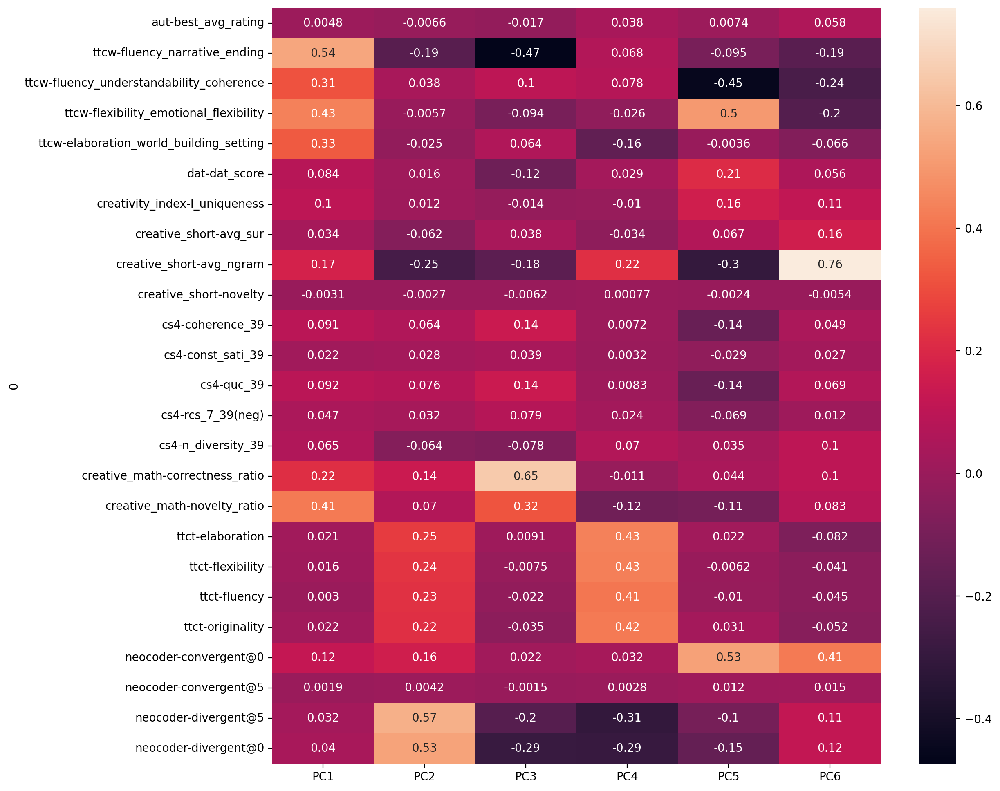

In [ ]:
import matplotlib.pyplot as plt
fig, ax = plt.subplots(figsize=(12, 12))

sns.heatmap(loadings.T, annot=True)

# 3 Overall Performances


## 3.1 Radar Graph

In [128]:
# import matplotlib.pyplot as plt

In [129]:
results_df = read_result_df()
results_df.columns

Index(['model', 'size', 'type', 'family', 'Knowledge Cutoff Date',
       'Release Date', 'date', 'short name', 'aut-best_avg_rating',
       'ttcw-fluency_narrative_ending',
       'ttcw-fluency_understandability_coherence',
       'ttcw-flexibility_emotional_flexibility',
       'ttcw-elaboration_world_building_setting', 'dat-dat_score',
       'creativity_index-l_uniqueness', 'creative_short-avg_sur',
       'creative_short-avg_ngram', 'creative_short-novelty',
       'cs4-coherence_39', 'cs4-const_sati_39', 'cs4-quc_39',
       'cs4-rcs_7_39(neg)', 'cs4-n_diversity_39',
       'creative_math-correctness_ratio', 'creative_math-novelty_ratio',
       'ttct-elaboration', 'ttct-flexibility', 'ttct-fluency',
       'ttct-originality', 'neocoder-convergent@0', 'neocoder-convergent@5',
       'neocoder-divergent@5', 'neocoder-divergent@0', '', '',
       'Neocoder-divergent', 'Neocoder-convergent'],
      dtype='object', name=0)

In [130]:
# all_cols = []
# for k in group2scores:
#     all_cols.extend(group2scores[k])
# all_cols

In [131]:
task_lst = [
    'ttcw',
    'aut',
    'creativity_index',
    'creative_short',
    'dat',
    'cs4',
    'creative_math',
    'neocoder',
    'ttct'
]

default_grouping = {
    task: [col for col in results_df.columns if task in col]
    for task in task_lst
}

In [132]:
# tmp_result_df[score_grouping[k]].astype(float)

In [133]:
# col_lst = []
col_lst = ['model', 'size', 'family', 'short name', 'type'] + list(metric2group.keys())
tmp_result_df = results_df[col_lst].dropna()#.iloc[:13]
# tmp_result_df

for k in group2metric:
    # print(k)
    tmp_result_df[k] = tmp_result_df[group2metric[k]].astype(float).apply(lambda x: x.mean(), axis = 1)
# tmp_result_df
tmp_result_df[list(group2metric.keys()) + ['model']]

,diversity,novelty,quality,model
1,0.64880,0.546056,0.35905,Mistral-7B-Instruct-v0.3
2,0.48858,0.521344,0.40731,Qwen2.5-7B-Instruct
3,0.69798,0.442378,0.41762,OLMo-2-1124-7B-Instruct
4,0.56622,0.524067,0.35394,Llama-3.1-8B-Instruct
5,0.70676,0.440078,0.41850,OLMo-2-1124-13B-Instruct
6,0.59074,0.561067,0.43422,Mistral-Small-24B-Instruct-2501
7,0.64398,0.416767,0.42568,Qwen2.5-32B-Instruct
8,0.62958,0.530644,0.36702,Mixtral-8x7B-Instruct-v0.1
9,0.56164,0.558733,0.45826,Llama-3.3-70B-Instruct
10,0.67366,0.555156,0.52683,Qwen2.5-72B-Instruct


In [134]:
# metric2group

In [135]:
# tmp_result_df.loc[5].loc['model']

In [136]:
# tmp_result_df['model']

In [137]:
short = {
    "Mistral-7B-Instruct-v0.3": "Mistral‑7B",
    "Qwen2.5-7B-Instruct":     "Qwen‑7B",
    "OLMo-2-1124-7B-Instruct": "OLMo‑7B",
    "Llama-3.1-8B-Instruct":   "Llama‑8B",
    "OLMo-2-1124-13B-Instruct":"OLMo‑13B",
    "Mistral-Small-24B-Instruct-2501": "Mistral‑24B",
    "Qwen2.5-32B-Instruct":    "Qwen‑32B",
    "Mixtral-8x7B-Instruct-v0.1":"Mixtral‑8x7B",
    "Llama-3.3-70B-Instruct":  "Llama‑70B",
    "Qwen2.5-72B-Instruct":    "Qwen‑72B",
    "GPT-4.1":                 "GPT‑4.1",
    "GPT-4.1-mini":            "GPT‑4.1‑mini",
    "Gemini 2.0 Flash":        "Gemini‑Flash",
    "DeepSeek-V3":             "DeepSeek-V3",
    "DeepSeek-R1":             "DeepSeek-R1",
    "Claude-3.7 Sonnet":       "Claude-Sonnet",
    "Claude 3.5 Haiku":        "Claude-Haiku",
}


def radar(tmp_result_df, metrics):
    df = tmp_result_df[metrics + ['short name']]
    # df["label"] = df["model"].apply(
    #     lambda x: short[x.strip()] if x.strip() in short else x
    # ).fillna(df["model"])
    df['label'] = df['short name']

    target_lo, target_hi = 0.2, 1.0          # new range
    scale = target_hi - target_lo            # = 0.8

    df_norm = df.copy()
    for m in metrics:
        lo, hi = df[m].min(), df[m].max()
        if hi == lo:                         # safety for degenerate columns
            df_norm[m] = target_hi           # or pick whatever default you like
        else:
            df_norm[m] = target_lo + (df[m] - lo) / (hi - lo) * scale
    angles = np.linspace(0, 2*np.pi, len(metrics), endpoint=False).tolist()
    angles += angles[:1]                   # close the loop

    sns.set_theme(style="whitegrid")       # Seaborn look
    fig = plt.figure(figsize=(7, 7))
    ax = plt.subplot(111, polar=True)

    # grid & labels
    ax.set_theta_offset(np.pi / 2)         # start at top
    ax.set_theta_direction(-1)
    ax.set_xticks(angles[:-1])
    ax.set_xticklabels([m.capitalize() for m in metrics])
    ax.set_yticks(np.linspace(0,1,6))
    ax.set_yticklabels([f"{y:.1f}" for y in np.linspace(0,1,6)])
    ax.set_ylim(0, 1)


    # palette = sns.color_palette("husl", len(df_norm) + 1)   # vibrant but distinct
    palette = sns.color_palette("tab20", 20)#[:df_norm.shape[0] + 1]

    for idx, row in df_norm.iterrows():
        values = row[metrics].tolist()
        values += values[:1]                            # loop back to first value
        ax.plot(
            angles,
            values,
            linewidth=1.6,
            label=row["label"],
            color=palette[idx]
        )
        ax.fill(angles, values, alpha=0.15, color=palette[idx])


    ax.legend(bbox_to_anchor=(1.2, 0.5), loc="center left", frameon=False)
    plt.show()


In [138]:
tmp_result_df

,model,size,family,short name,type,aut-best_avg_rating,ttcw-fluency_narrative_ending,ttcw-fluency_understandability_coherence,ttcw-flexibility_emotional_flexibility,ttcw-elaboration_world_building_setting,...,ttct-flexibility,ttct-fluency,ttct-originality,neocoder-convergent@0,neocoder-convergent@5,neocoder-divergent@5,neocoder-divergent@0,diversity,novelty,quality
1,Mistral-7B-Instruct-v0.3,7B,Mistral,Mistral-7B,open,0.718,0.17,0.08,0,0,...,0.7757,0.766,0.7279,0,0,1,0.9949,0.64880,0.546056,0.35905
2,Qwen2.5-7B-Instruct,7B,Qwen,Qwen2.5-7B,open,0.602,0.08,0.17,0,0,...,0.7842,0.7666,0.7181,0.0202,0,0.9158,0.8485,0.48858,0.521344,0.40731
3,OLMo-2-1124-7B-Instruct,7B,Olmo,OLMo2-7B,open,0.624,0.75,0.25,0.17,0.08,...,0.7159,0.7024,0.6795,0,0,0.5773,0.649,0.69798,0.442378,0.41762
4,Llama-3.1-8B-Instruct,8B,Llama,Llama3.1-8B,open,0.632,0,0.08,0.08,0,...,0.7395,0.7203,0.6981,0.0051,0,0.9845,0.996,0.56622,0.524067,0.35394
5,OLMo-2-1124-13B-Instruct,13B,Olmo,OLMo2-13B,open,0.69,0.67,0.33,0.25,0.08,...,0.6455,0.627,0.6142,0.0051,0,0.4433,0.5303,0.70676,0.440078,0.41850
6,Mistral-Small-24B-Instruct-2501,24B,Mistral,Mistral-24B,open,0.604,0.25,0.25,0,0,...,0.7355,0.7064,0.6842,0,0,0.9897,0.9848,0.59074,0.561067,0.43422
7,Qwen2.5-32B-Instruct,32B,Qwen,Qwen2.5-32B,open,0.674,0,0.17,0,0,...,0.7976,0.7727,0.7304,0.0051,0,0.3402,0.2778,0.64398,0.416767,0.42568
8,Mixtral-8x7B-Instruct-v0.1,56B,Mistral,Mixtral-8x7B,open,0.708,0.17,0.08,0,0,...,0.716,0.734,0.6712,0.0253,0,0.9897,0.9747,0.62958,0.530644,0.36702
9,Llama-3.3-70B-Instruct,70B,Llama,Llama3.3-70B,open,0.69,0,0.33,0,0,...,0.7904,0.7664,0.7341,0.1515,0,1,1,0.56164,0.558733,0.45826
10,Qwen2.5-72B-Instruct,72B,Qwen,Qwen2.5-72B,open,0.636,0.42,0.5,0.08,0.17,...,0.8052,0.7704,0.7301,0,0,0.7938,0.8485,0.67366,0.555156,0.52683


In [ ]:
creativity_aspects = ["diversity", "novelty", "quality"]

# col_lst = []
col_lst = ['model', 'size', 'family', 'short name', 'type'] + list(metric2group.keys())
tmp_result_df = results_df[col_lst].dropna()#.iloc[:13]
# tmp_result_df

for k in group2metric:
    # print(k)
    tmp_result_df[k] = tmp_result_df[group2metric[k]].astype(float).apply(lambda x: x.mean(), axis = 1)

<ipython-input-35-244bc6f82726>:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['label'] = df['short name']


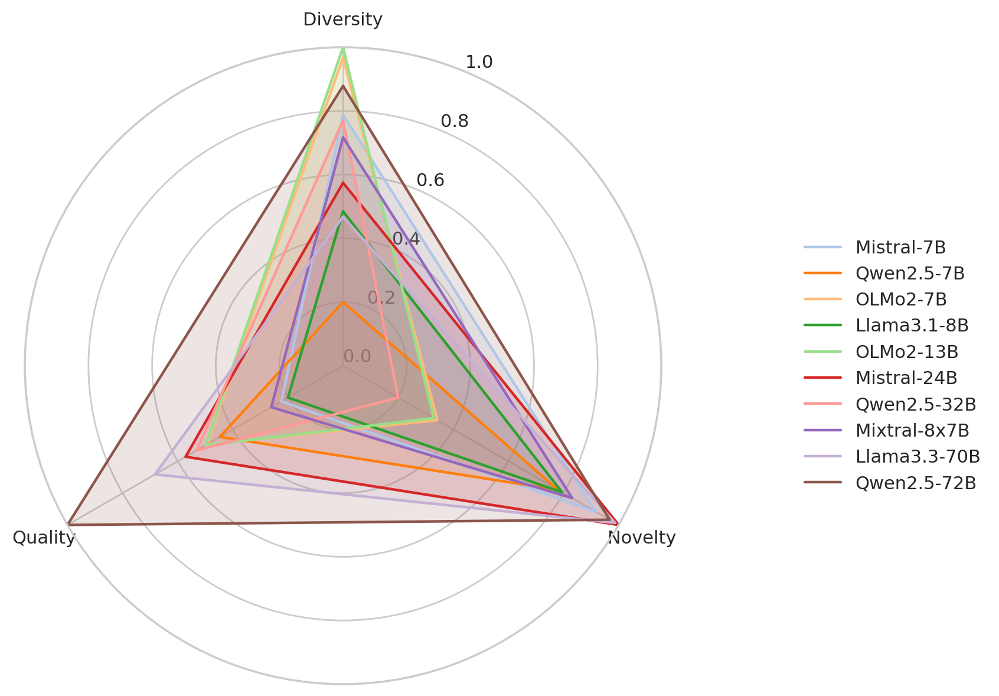

In [ ]:
radar(tmp_result_df.query('type == "open"'), creativity_aspects)

<ipython-input-35-244bc6f82726>:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['label'] = df['short name']


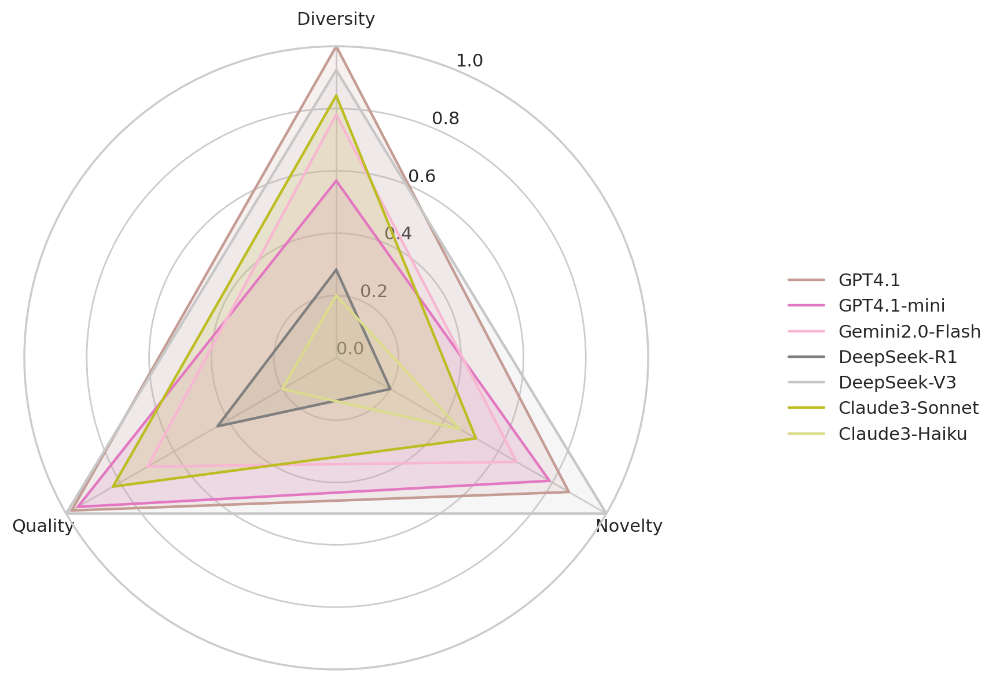

In [ ]:
radar(tmp_result_df.query('type == "closed"'), creativity_aspects)

<ipython-input-35-244bc6f82726>:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['label'] = df['short name']


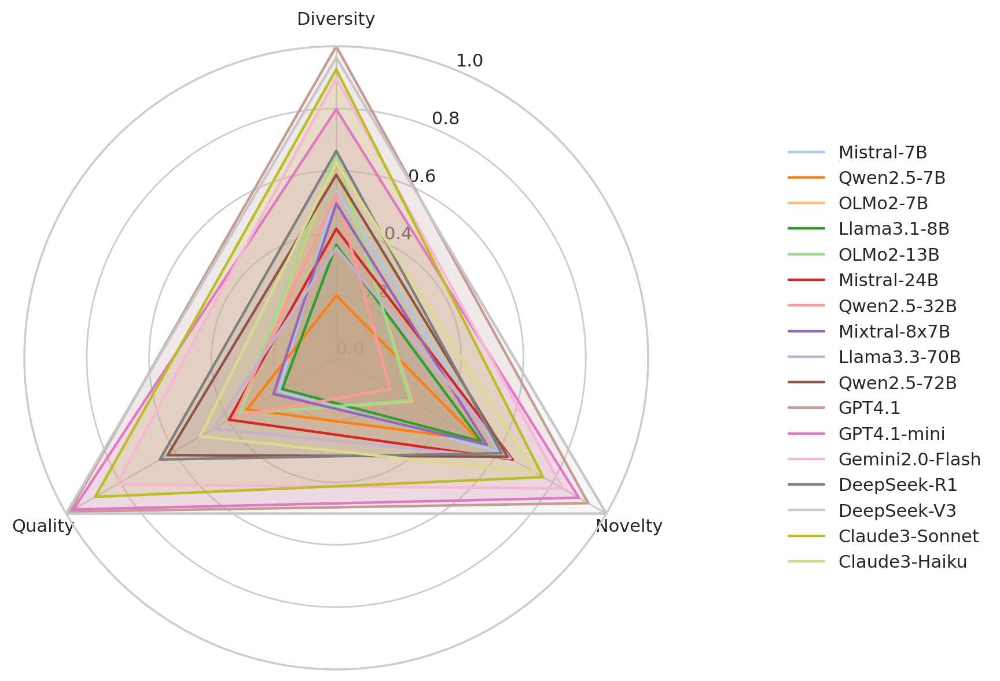

In [ ]:
radar(tmp_result_df, creativity_aspects)

In [ ]:
# col_lst = []

col_lst = ['model', 'size', 'family', 'short name', 'type']
# col_lst = []
for col in results_df.columns:
    for t in task_lst:
        if t in col:
            col_lst.append(col)
            break
tmp_result_df = results_df[col_lst]#.dropna().iloc[:13]
# tmp_result_df

for k in default_grouping:
    # print(k)
    tmp_result_df[k] = tmp_result_df[default_grouping[k]].astype(float).apply(lambda x: x.mean(), axis = 1)
# tmp_result_df
tmp_result_df[list(default_grouping.keys()) + ['model']]

metrics = list(default_grouping.keys())

radar(tmp_result_df, metrics)

<ipython-input-41-e7ca4d9dbbf2>:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  tmp_result_df[k] = tmp_result_df[default_grouping[k]].astype(float).apply(lambda x: x.mean(), axis = 1)
<ipython-input-41-e7ca4d9dbbf2>:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  tmp_result_df[k] = tmp_result_df[default_grouping[k]].astype(float).apply(lambda x: x.mean(), axis = 1)
<ipython-input-41-e7ca4d9dbbf2>:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .l

ValueError: could not convert string to float: '#VALUE!'

In [ ]:
tmp_result_df.query('type == "closed"')

In [ ]:
results_df

In [ ]:
metrics

In [ ]:
radar(tmp_result_df.query('type == "open"'), metrics)

In [ ]:
tmp_result_df.query('type == "closed"')

In [ ]:
radar(tmp_result_df.query('type == "closed"'), metrics)

## 3.2 Model year

In [ ]:
# model_date_mapping = dict(zip(results_df.loc[:18]['short name'], results_df.loc[:18]['date']))
# model_date_mapping

In [153]:
col_lst = ['short name', 'date'] + list(metric2task.keys())

tmp_result_df = results_df[col_lst].dropna()#.iloc[:13]
for col in list(metric2task.keys()):
    tmp_result_df[col] = tmp_result_df[col].apply(lambda x: float(x))
tmp_result_df

,short name,date,aut-best_avg_rating,ttcw-fluency_narrative_ending,ttcw-fluency_understandability_coherence,ttcw-flexibility_emotional_flexibility,ttcw-elaboration_world_building_setting,dat-dat_score,creativity_index-l_uniqueness,creative_short-avg_sur,...,creative_math-correctness_ratio,creative_math-novelty_ratio,ttct-elaboration,ttct-flexibility,ttct-fluency,ttct-originality,neocoder-convergent@0,neocoder-convergent@5,neocoder-divergent@5,neocoder-divergent@0
1,Mistral-7B,358,0.718,0.17,0.08,0.00,0.00,0.7908,0.4496,0.0889,...,0.2544,0.0296,0.7861,0.7757,0.7660,0.7279,0.0000,0.0000,1.0000,0.9949
2,Qwen2.5-7B,238,0.602,0.08,0.17,0.00,0.00,0.6907,0.4354,0.0834,...,0.7875,0.1620,0.8073,0.7842,0.7666,0.7181,0.0202,0.0000,0.9158,0.8485
3,OLMo2-7B,170,0.624,0.75,0.25,0.17,0.08,0.8058,0.4810,0.0599,...,0.3711,0.0453,0.7226,0.7159,0.7024,0.6795,0.0000,0.0000,0.5773,0.6490
4,Llama3.1-8B,296,0.632,0.00,0.08,0.08,0.00,0.8208,0.4724,0.0490,...,0.5819,0.0610,0.7831,0.7395,0.7203,0.6981,0.0051,0.0000,0.9845,0.9960
5,OLMo2-13B,170,0.690,0.67,0.33,0.25,0.08,0.8133,0.4860,0.2043,...,0.5087,0.1150,0.6540,0.6455,0.6270,0.6142,0.0051,0.0000,0.4433,0.5303
6,Mistral-24B,104,0.604,0.25,0.25,0.00,0.00,0.6004,0.4752,0.1406,...,0.6899,0.2143,0.7556,0.7355,0.7064,0.6842,0.0000,0.0000,0.9897,0.9848
7,Qwen2.5-32B,238,0.674,0.00,0.17,0.00,0.00,0.6919,0.4663,0.1263,...,0.8972,0.2213,0.8199,0.7976,0.7727,0.7304,0.0051,0.0000,0.3402,0.2778
8,Mixtral-8x7B,521,0.708,0.17,0.08,0.00,0.00,0.8298,0.4149,0.0601,...,0.5697,0.1150,0.7131,0.7160,0.7340,0.6712,0.0253,0.0000,0.9897,0.9747
9,Llama3.3-70B,160,0.690,0.00,0.33,0.00,0.00,0.6940,0.4226,0.0590,...,0.8606,0.1777,0.8339,0.7904,0.7664,0.7341,0.1515,0.0000,1.0000,1.0000
10,Qwen2.5-72B,238,0.636,0.42,0.50,0.08,0.17,0.7747,0.4133,0.1234,...,0.9042,0.4913,0.8220,0.8052,0.7704,0.7301,0.0000,0.0000,0.7938,0.8485


In [154]:
time_groupedbytask = group_by_task(
    tmp_result_df,
    task2metric,
)
time_groupedbytask['overall'] = time_groupedbytask.apply(
    lambda row: np.mean([
        row[col]
        for col in list(task2metric.keys())
    ])
, axis = 1)
time_groupedbytask = copy.deepcopy(time_groupedbytask[['short name', 'date', 'overall'] + list(task2metric.keys())])

#########

time_groupedby_creativity = group_by_task(
    tmp_result_df,
    group2metric,
    calculating_group = True
)
time_groupedby_creativity['overall'] = time_groupedbytask['overall']
time_groupedby_creativity['creative_overall'] = time_groupedby_creativity.apply(lambda x: np.mean([
    x['diversity'], x['novelty'], x['quality']
]), axis = 1)
time_groupedby_creativity['date'] = time_groupedby_creativity['date'].apply(lambda x: int(x))
time_groupedby_creativity = time_groupedby_creativity.sort_values(by = 'creative_overall', ascending = False)


### group by domain ###
domain2task = {
    'story': ['cs4', 'ttcw', 'creativity_index', 'creative_short'],
    'psychological': ['aut', 'ttct', 'dat'],
    'logical': ['creative_math', 'neocoder']
}
for task in list(task2metric.keys()):
    time_groupedby_creativity[task] = time_groupedbytask[task]
for domain in domain2task:
    time_groupedby_creativity[domain] = time_groupedby_creativity.apply(
        lambda row: np.mean([
            row[col] for col in domain2task[domain]
        ])
    , axis = 1)

time_groupedby_creativity = copy.deepcopy(time_groupedby_creativity[
    ['short name', 'date', 'overall', 'creative_overall'] + \
    list(group2metric.keys()) + list(domain2task.keys())
])
time_groupedby_creativity

,short name,date,overall,creative_overall,diversity,novelty,quality,story,psychological,logical
15,DeepSeek-V3,140,0.717399,0.757180,0.85384,0.701700,0.716000,0.647248,0.805000,0.726300
11,GPT4.1,31,0.703444,0.751228,0.87090,0.686007,0.696777,0.647031,0.793000,0.681938
16,Claude3-Sonnet,80,0.679290,0.721274,0.83544,0.656636,0.671747,0.597471,0.833358,0.611825
12,GPT4.1-mini,31,0.677689,0.709021,0.77430,0.671850,0.680913,0.616688,0.778100,0.649075
13,Gemini2.0-Flash,287,0.660951,0.706156,0.82186,0.651500,0.645107,0.554952,0.806400,0.654775
14,DeepSeek-R1,115,0.617820,0.623273,0.71034,0.586364,0.573113,0.616402,0.602825,0.643150
10,Qwen2.5-72B,238,0.578657,0.613835,0.67366,0.586929,0.580917,0.476742,0.730875,0.554163
17,Claude3-Haiku,205,0.593356,0.612689,0.69182,0.604107,0.542140,0.464406,0.782200,0.567988
9,Llama3.3-70B,160,0.530069,0.555160,0.56164,0.570521,0.533320,0.387098,0.721733,0.528512
6,Mistral-24B,104,0.517048,0.548833,0.59074,0.569214,0.486543,0.445721,0.641608,0.472862


In [155]:
res = stats.pearsonr(
    time_groupedby_creativity['diversity'].values,
    time_groupedby_creativity['novelty'].values
)
res

PearsonRResult(statistic=np.float64(0.7062984399168939), pvalue=np.float64(0.0015291186644491982))

In [156]:
res = stats.pearsonr(
    time_groupedby_creativity['quality'].values,
    time_groupedby_creativity['novelty'].values
)
res

PearsonRResult(statistic=np.float64(0.8913971685589975), pvalue=np.float64(1.5662913009368101e-06))

In [157]:
res = stats.pearsonr(
    time_groupedby_creativity['diversity'].values,
    time_groupedby_creativity['quality'].values
)
res

PearsonRResult(statistic=np.float64(0.7579534585937151), pvalue=np.float64(0.0004231008839140653))

In [158]:
# time_groupedby_creativity

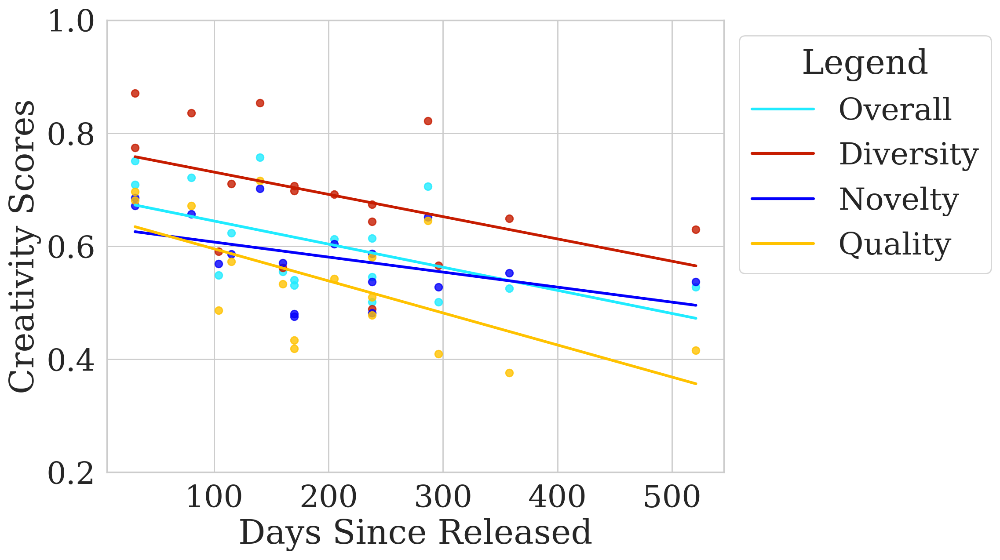

In [167]:
time_groupedby_creativity['date'] = time_groupedby_creativity['date'].apply(lambda x: int(x))
df = time_groupedby_creativity
sns.set(font_scale=2.3)
sns.set_style('whitegrid', {'font.family':'serif', 'font.serif':"Computer Modern"})

# Plot
plt.figure(figsize=(12, 7))

sns.regplot(
    data=df,
    x="date",
    y="creative_overall",
    scatter=True,
    ci=None,
    color=bar_plattee[8],
    line_kws={
        "color": bar_plattee[8],
        "label": "Overall"
    }
)

sns.regplot(
    data=df,
    x="date",
    y="diversity",
    scatter=True,
    ci=None,
    color=bar_plattee[1],
    line_kws={
        "color": bar_plattee[1],
        "label": "Diversity"
    }
)

sns.regplot(
    data=df,
    x="date",
    y="novelty",
    scatter=True,
    ci=None,
    color=bar_plattee[2],
    line_kws={
        "color": bar_plattee[2],
        "label": "Novelty"
    }
)

sns.regplot(
    data=df,
    x="date",
    y="quality",
    scatter=True,
    ci=None,
    color=bar_plattee[3],
    line_kws={
        "color": bar_plattee[3],
        "label": "Quality"
    }
)
plt.ylim(0.2, 1.)
plt.legend(title="Legend", frameon=True, bbox_to_anchor=(1, 1), loc="upper left")

# plt.title("Model Performance vs. Days Since Released")
plt.xlabel("Days Since Released")
plt.ylabel("Creativity Scores")
plt.grid(True)
plt.tight_layout()
plt.show()


## 3.3 Bar Chart

In [ ]:
df = time_groupedby_creativity

<ipython-input-50-8d1d6f986099>:7: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.barplot(
<ipython-input-50-8d1d6f986099>:7: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


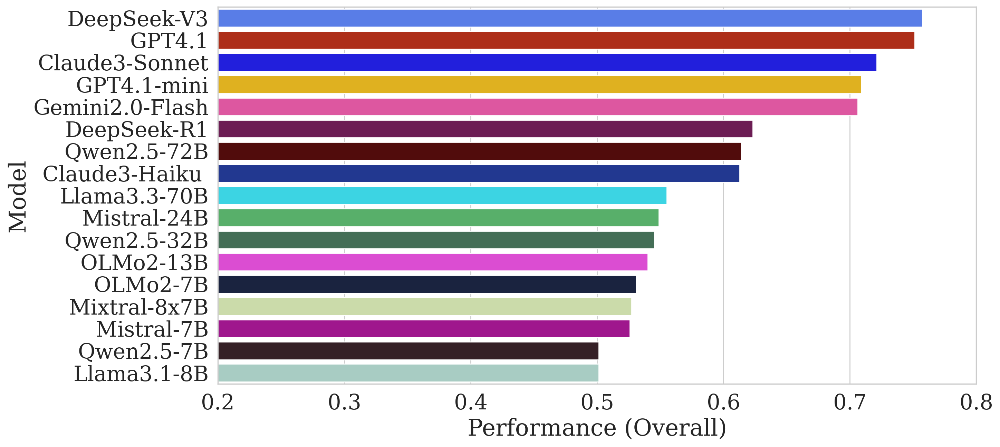

In [ ]:
# sns.set_theme(context="talk", style="whitegrid")
sns.set(font_scale=2)
sns.set_style('whitegrid', {'font.family':'serif', 'font.serif':"Computer Modern"})

fig, ax = plt.subplots(figsize=(15, 7))
ax.set_xlim(0.2, 0.8)
sns.barplot(
    data=df.sort_values(by = 'creative_overall', ascending = False),
    y="short name",
    x="creative_overall",
    # hue='temperature',
    # hue_order=[0.00, 0.25, 0.50, 0.75, 1.00],
    palette=bar_plattee,
    # dodge=True,
    ci=None,
    ax=ax,
    orient='h'
)

# plt.title("Performance (Overall)")
plt.xlabel("Performance (Overall)")
# plt.xlabel("")

plt.ylabel("Model")
# plt.grid(True)
plt.tight_layout()
plt.show()

In [ ]:
# sns.color_palette("Paired")


<ipython-input-51-2165690a017d>:5: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.barplot(
<ipython-input-51-2165690a017d>:5: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


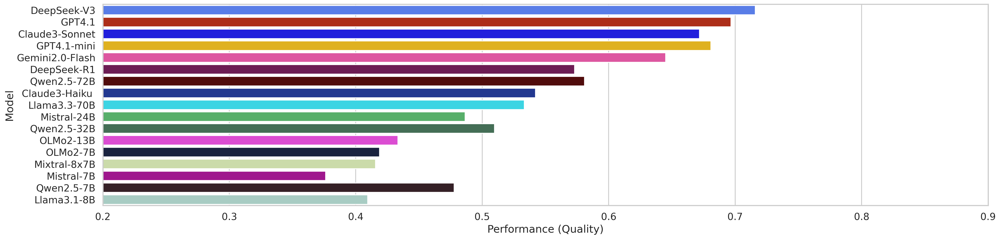

In [ ]:
sns.set_theme(context="talk", style="whitegrid")

fig, ax = plt.subplots(figsize=(24, 6))
ax.set_xlim(0.2, 0.9)
sns.barplot(
    data=df.sort_values(by = 'creative_overall', ascending = False),
    y="short name",
    x="quality",
    # hue='temperature',
    # hue_order=[0.00, 0.25, 0.50, 0.75, 1.00],
    palette=bar_plattee,
    # dodge=True,
    ci=None,
    ax=ax,
    orient='h'
)

# plt.title("Performance (Quality)")
plt.xlabel("Performance (Quality)")
plt.ylabel("Model")
# plt.grid(True)
plt.tight_layout()
plt.show()

<ipython-input-52-eea4bf843530>:4: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.barplot(
<ipython-input-52-eea4bf843530>:4: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


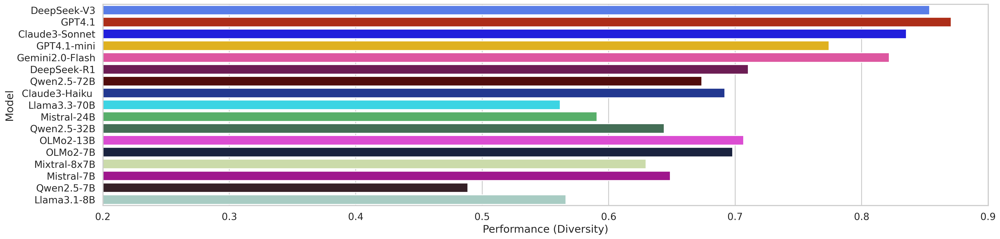

In [ ]:
sns.set_theme(context="talk", style="whitegrid")
fig, ax = plt.subplots(figsize=(24, 6))
ax.set_xlim(0.2, 0.9)
sns.barplot(
    data=df.sort_values(by = 'creative_overall', ascending = False),
    y="short name",
    x="diversity",
    # hue='temperature',
    # hue_order=[0.00, 0.25, 0.50, 0.75, 1.00],
    palette=bar_plattee,
    # dodge=True,
    ci=None,
    ax=ax,
    orient='h'
)

# plt.title("Performance (Diversity)")
plt.xlabel("Performance (Diversity)")
plt.ylabel("Model")
# plt.grid(True)
plt.tight_layout()
plt.show()

<ipython-input-53-130dd86eb923>:4: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.barplot(
<ipython-input-53-130dd86eb923>:4: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


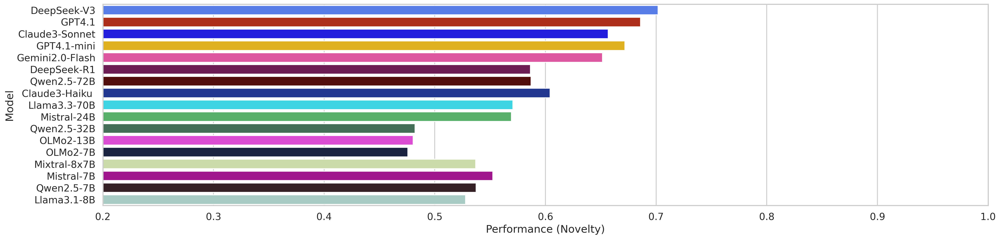

In [ ]:
sns.set_theme(context="talk", style="whitegrid")
fig, ax = plt.subplots(figsize=(24, 6))
ax.set_xlim(0.2, 1)
sns.barplot(
    data=df.sort_values(by = 'creative_overall', ascending = False),
    y="short name",
    x="novelty",
    # hue='temperature',
    # hue_order=[0.00, 0.25, 0.50, 0.75, 1.00],
    palette=bar_plattee,
    # dodge=True,
    ci=None,
    ax=ax,
    orient='h'
)

# plt.title("Performance (Novelty)")
plt.xlabel("Performance (Novelty)")
plt.ylabel("Model")
# plt.grid(True)
plt.tight_layout()
plt.show()

In [ ]:
df

,short name,date,aut-best_avg_rating,ttcw-fluency_narrative_ending,ttcw-fluency_understandability_coherence,ttcw-flexibility_emotional_flexibility,ttcw-elaboration_world_building_setting,dat-dat_score,creativity_index-l_uniqueness,creative_short-avg_sur,...,diversity,creative_short-avg,neocoder-avg,novelty,ttcw-avg,cs4-avg,ttct-avg,quality,overall,creative_overall
1,Mistral-7B,358,0.718,0.17,0.08,0.00,0.00,0.7908,0.4496,0.0889,...,0.64880,0.04990,0.00000,0.552450,0.083333,0.76700,0.77605,0.376157,0.505874,0.525802
2,Qwen2.5-7B,238,0.602,0.08,0.17,0.00,0.00,0.6907,0.4354,0.0834,...,0.48858,0.04800,0.01010,0.537421,0.083333,0.72075,0.78695,0.477727,0.484645,0.501243
3,OLMo2-7B,170,0.624,0.75,0.25,0.17,0.08,0.8058,0.4810,0.0599,...,0.69798,0.03810,0.00000,0.475736,0.360000,0.65005,0.71250,0.418730,0.503334,0.530815
4,Llama3.1-8B,296,0.632,0.00,0.08,0.08,0.00,0.8208,0.4724,0.0490,...,0.56622,0.03115,0.00255,0.527886,0.026667,0.68450,0.75170,0.409463,0.490640,0.501190
5,OLMo2-13B,170,0.690,0.67,0.33,0.25,0.08,0.8133,0.4860,0.2043,...,0.70676,0.11120,0.00255,0.480386,0.360000,0.65510,0.64050,0.433370,0.517969,0.540172
6,Mistral-24B,104,0.604,0.25,0.25,0.00,0.00,0.6004,0.4752,0.1406,...,0.59074,0.07785,0.00000,0.569214,0.166667,0.84515,0.73100,0.486543,0.517048,0.548833
7,Qwen2.5-32B,238,0.674,0.00,0.17,0.00,0.00,0.6919,0.4663,0.1263,...,0.64398,0.06725,0.00255,0.482093,0.056667,0.79595,0.79630,0.509733,0.504931,0.545269
8,Mixtral-8x7B,521,0.708,0.17,0.08,0.00,0.00,0.8298,0.4149,0.0601,...,0.62958,0.03550,0.01265,0.536871,0.083333,0.68905,0.72355,0.415657,0.511075,0.527369
9,Llama3.3-70B,160,0.690,0.00,0.33,0.00,0.00,0.6940,0.4226,0.0590,...,0.56164,0.03495,0.07575,0.570521,0.110000,0.82010,0.80015,0.533320,0.530069,0.555160
10,Qwen2.5-72B,238,0.636,0.42,0.50,0.08,0.17,0.7747,0.4133,0.1234,...,0.67366,0.06675,0.00000,0.586929,0.363333,0.84085,0.79620,0.580917,0.578657,0.613835


<ipython-input-55-fb439fffd8a4>:4: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.barplot(


ValueError: Could not interpret value `story` for `x`. An entry with this name does not appear in `data`.

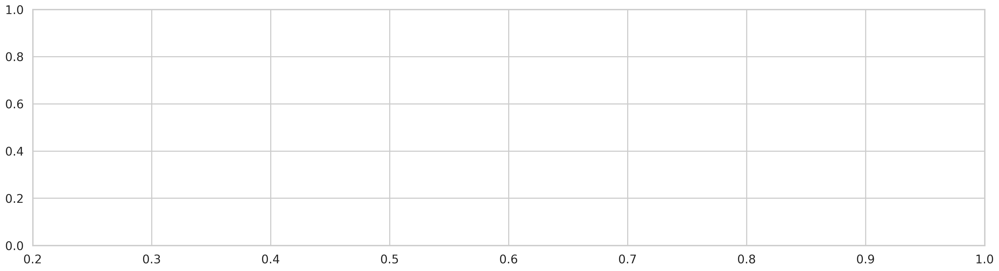

In [ ]:
sns.set_theme(context="talk", style="whitegrid")
fig, ax = plt.subplots(figsize=(24, 6))
ax.set_xlim(0.2, 1)
sns.barplot(
    data=df.sort_values(by = 'creative_overall', ascending = False),
    y="short name",
    x="story",
    # hue='temperature',
    # hue_order=[0.00, 0.25, 0.50, 0.75, 1.00],
    palette=bar_plattee,
    # dodge=True,
    ci=None,
    ax=ax,
    orient='h'
)

# plt.title("Performance (Novelty)")
plt.xlabel("Performance (Creative Writing)")
plt.ylabel("Model")
# plt.grid(True)
plt.tight_layout()
plt.show()

<ipython-input-56-a021981b8f9b>:4: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.barplot(


ValueError: Could not interpret value `psychological` for `x`. An entry with this name does not appear in `data`.

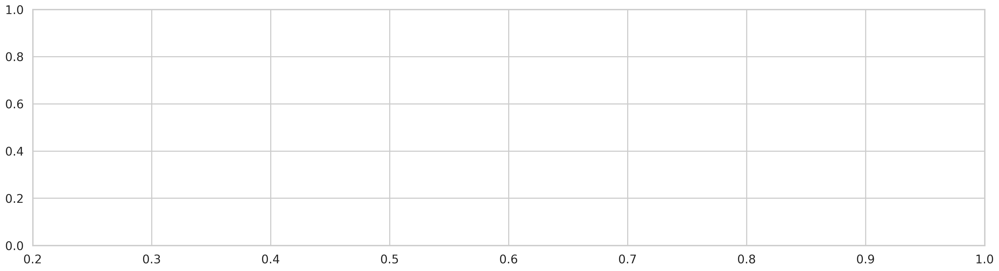

In [ ]:
sns.set_theme(context="talk", style="whitegrid")
fig, ax = plt.subplots(figsize=(24, 6))
ax.set_xlim(0.2, 1)
sns.barplot(
    data=df.sort_values(by = 'creative_overall', ascending = False),
    y="short name",
    x="psychological",
    # hue='temperature',
    # hue_order=[0.00, 0.25, 0.50, 0.75, 1.00],
    palette=bar_plattee,
    # dodge=True,
    ci=None,
    ax=ax,
    orient='h'
)

# plt.title("Performance (Novelty)")
plt.xlabel("Performance (Psychological Test)")
plt.ylabel("Model")
# plt.grid(True)
plt.tight_layout()
plt.show()

<ipython-input-57-c7b961dc2ea6>:4: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.barplot(


ValueError: Could not interpret value `logical` for `x`. An entry with this name does not appear in `data`.

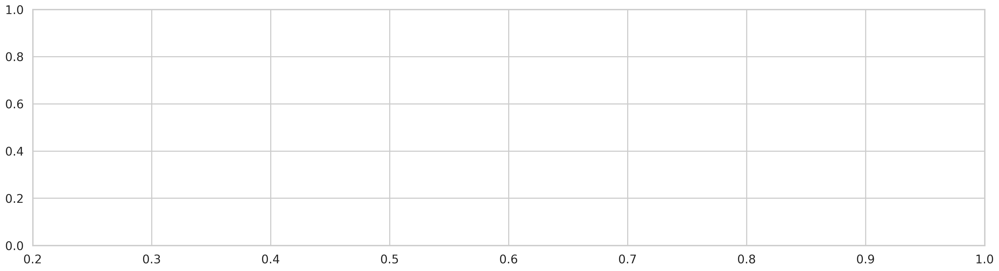

In [ ]:
sns.set_theme(context="talk", style="whitegrid")
fig, ax = plt.subplots(figsize=(24, 6))
ax.set_xlim(0.2, 1)
sns.barplot(
    data=df.sort_values(by = 'creative_overall', ascending = False),
    y="short name",
    x="logical",
    # hue='temperature',
    # hue_order=[0.00, 0.25, 0.50, 0.75, 1.00],
    palette=bar_plattee,
    # dodge=True,
    ci=None,
    ax=ax,
    orient='h'
)

# plt.title("Performance (Novelty)")
plt.xlabel("Performance (Logical Reasoning)")
plt.ylabel("Model")
# plt.grid(True)
plt.tight_layout()
plt.show()

In [ ]:
# stacked = stack_data_for_sns(
#     time_groupedby_creativity,
#     repeat_cols = ["short name", "date"],
#     stack_cols = ["overall", "diversity", "novelty", "quality"],
#     stack_col_name = "score",
#     group_col_name = "measurement"
# )
# stacked

In [ ]:
# sns.scatterplot(
#     x = 'date',
#     y = 'score',
#     hue = 'measurement',
#     data = stacked,
#     palette=bar_plattee
# )

## 3.4 Table

In [ ]:
# col_lst = ['short name', 'date'] + list(metric2task.keys())

# tmp_result_df = results_df[col_lst].dropna()#.iloc[:13]
# for col in list(metric2task.keys()):
#     tmp_result_df[col] = tmp_result_df[col].apply(lambda x: float(x))
# tmp_result_df

In [ ]:
col_lst = ['short name', 'date'] + list(metric2task.keys())

tmp_result_df = results_df[col_lst].dropna()#.iloc[:13]
for col in list(metric2task.keys()):
    tmp_result_df[col] = tmp_result_df[col].apply(lambda x: float(x))
# tmp_result_df

time_groupedbytask = group_by_task(
    tmp_result_df,
    task2metric,
)
time_groupedbytask['overall'] = time_groupedbytask.apply(
    lambda row: np.mean([
        row[col]
        for col in list(task2metric.keys())
    ])
, axis = 1)
time_groupedbytask = copy.deepcopy(time_groupedbytask[['short name', 'date', 'overall'] + list(task2metric.keys())])

#########

time_groupedby_creativity = group_by_task(
    tmp_result_df,
    group2metric,
    calculating_group = True
)
time_groupedby_creativity['overall'] = time_groupedbytask['overall']
time_groupedby_creativity['creative_overall'] = time_groupedby_creativity.apply(lambda x: np.mean([
    x['diversity'], x['novelty'], x['quality']
]), axis = 1)
time_groupedby_creativity['date'] = time_groupedby_creativity['date'].apply(lambda x: int(x))
time_groupedby_creativity = time_groupedby_creativity.sort_values(by = 'creative_overall', ascending = False)


### group by domain ###
domain2task = {
    'story': ['cs4', 'ttcw', 'creativity_index', 'creative_short'],
    'psychological': ['aut', 'ttct', 'dat'],
    'logical': ['creative_math', 'neocoder']
}
for task in list(task2metric.keys()):
    time_groupedby_creativity[task] = time_groupedbytask[task]
for domain in domain2task:
    time_groupedby_creativity[domain] = time_groupedby_creativity.apply(
        lambda row: np.mean([
            row[col] for col in domain2task[domain]
        ])
    , axis = 1)

### put together ###
time_groupedby_creativity = copy.deepcopy(
    time_groupedby_creativity[
        ['short name', 'creative_overall'] + \
        list(group2metric.keys()) + list(domain2task.keys())#list(task2metric.keys())
    ]
).round(3)

time_groupedby_creativity

# 5 Inter-column Correlations

## 5.1 No grouping

In [ ]:
task_lst = [
    'ttcw',
    'aut',
    'creativity_index',
    'creative_short',
    'dat-',
    'cs4',
    'creative_math',
    'neocoder',
    # 'date',
    'ttct'
]

exclude_lst = [
    'creative_short-avg_3_gram'
]

# col_lst = ['model', 'Size', 'Family']
col_lst = []
for col in results_df.columns:
    for t in task_lst:
        if t in col and col not in exclude_lst:
            col_lst.append(col)
            break
# col_lst

tmp_result_df = results_df[col_lst].dropna()#.iloc[:13]
tmp_result_df

,aut-best_avg_rating,ttcw-fluency_narrative_ending,ttcw-fluency_understandability_coherence,ttcw-flexibility_emotional_flexibility,ttcw-elaboration_world_building_setting,dat-dat_score,creativity_index-l_uniqueness,creative_short-avg_sur,creative_short-avg_ngram,creative_short-novelty,...,creative_math-correctness_ratio,creative_math-novelty_ratio,ttct-elaboration,ttct-flexibility,ttct-fluency,ttct-originality,neocoder-convergent@0,neocoder-convergent@5,neocoder-divergent@5,neocoder-divergent@0
1,0.718,0.17,0.08,0,0,0.7908,0.4496,0.0889,0.81,0.0109,...,0.2544,0.0296,0.7861,0.7757,0.766,0.7279,0,0,1,0.9949
2,0.602,0.08,0.17,0,0,0.6907,0.4354,0.0834,0.22,0.0126,...,0.7875,0.162,0.8073,0.7842,0.7666,0.7181,0.0202,0,0.9158,0.8485
3,0.624,0.75,0.25,0.17,0.08,0.8058,0.4810,0.0599,0.895,0.0163,...,0.3711,0.0453,0.7226,0.7159,0.7024,0.6795,0,0,0.5773,0.649
4,0.632,0,0.08,0.08,0,0.8208,0.4724,0.049,0.41,0.0133,...,0.5819,0.061,0.7831,0.7395,0.7203,0.6981,0.0051,0,0.9845,0.996
5,0.69,0.67,0.33,0.25,0.08,0.8133,0.4860,0.2043,0.905,0.0181,...,0.5087,0.115,0.654,0.6455,0.627,0.6142,0.0051,0,0.4433,0.5303
6,0.604,0.25,0.25,0,0,0.6004,0.4752,0.1406,0.82,0.0151,...,0.6899,0.2143,0.7556,0.7355,0.7064,0.6842,0,0,0.9897,0.9848
7,0.674,0,0.17,0,0,0.6919,0.4663,0.1263,0.87,0.0082,...,0.8972,0.2213,0.8199,0.7976,0.7727,0.7304,0.0051,0,0.3402,0.2778
8,0.708,0.17,0.08,0,0,0.8298,0.4149,0.0601,0.715,0.0109,...,0.5697,0.115,0.7131,0.716,0.734,0.6712,0.0253,0,0.9897,0.9747
9,0.69,0,0.33,0,0,0.694,0.4226,0.059,0.545,0.0109,...,0.8606,0.1777,0.8339,0.7904,0.7664,0.7341,0.1515,0,1,1
10,0.636,0.42,0.5,0.08,0.17,0.7747,0.4133,0.1234,0.86,0.0101,...,0.9042,0.4913,0.822,0.8052,0.7704,0.7301,0,0,0.7938,0.8485


In [ ]:
# import pandas as pd, numpy as np, seaborn as sns, matplotlib.pyplot as plt
# from scipy.cluster.hierarchy import linkage, dendrogram, fcluster
# from scipy.spatial.distance import squareform

# # corr
# corr = tmp_result_df.corr(method="spearman").abs()
# dist = np.sqrt(0.5 * (1 - corr))
# link = linkage(squareform(dist), method="average")

# plt.figure(figsize=(20, 20))
# dendrogram(link, labels=corr.columns, leaf_rotation=90)
# plt.tight_layout(); plt.show()

# clusters = fcluster(link, t=0.7, criterion="distance")  # tweak t
# task_groups = pd.Series(clusters, index=corr.columns)


In [ ]:
all_corr = []
all_unique_corr = {}
for col in tmp_result_df.columns:
    tmp_corr = dict(tmp_result_df.corrwith(tmp_result_df[col]))
    all_corr.append(tmp_corr)
    for m in tmp_corr:
        if (col, m) in all_unique_corr or col == m: continue
        all_unique_corr[(m, col)] = float(tmp_corr[m].round(2))

all_corr_df = pd.DataFrame(all_corr, index = tmp_result_df.columns).round(2)
all_corr_df

,aut-best_avg_rating,ttcw-fluency_narrative_ending,ttcw-fluency_understandability_coherence,ttcw-flexibility_emotional_flexibility,ttcw-elaboration_world_building_setting,dat-dat_score,creativity_index-l_uniqueness,creative_short-avg_sur,creative_short-avg_ngram,creative_short-novelty,...,creative_math-correctness_ratio,creative_math-novelty_ratio,ttct-elaboration,ttct-flexibility,ttct-fluency,ttct-originality,neocoder-convergent@0,neocoder-convergent@5,neocoder-divergent@5,neocoder-divergent@0
0,,,,,,,,,,,,,,,,,,,,,
aut-best_avg_rating,1.00,0.05,0.04,0.11,0.05,0.40,-0.03,-0.14,0.30,-0.27,...,-0.10,0.07,0.11,0.12,0.16,0.16,0.06,0.01,-0.07,-0.08
ttcw-fluency_narrative_ending,0.05,1.00,0.82,0.87,0.84,0.64,0.73,0.30,0.63,-0.29,...,0.32,0.75,0.01,0.00,-0.05,0.05,0.38,0.24,-0.02,0.05
ttcw-fluency_understandability_coherence,0.04,0.82,1.00,0.77,0.86,0.41,0.61,0.25,0.46,-0.49,...,0.65,0.87,0.20,0.18,0.11,0.19,0.31,0.08,0.09,0.12
ttcw-flexibility_emotional_flexibility,0.11,0.87,0.77,1.00,0.89,0.67,0.81,0.30,0.44,-0.54,...,0.51,0.84,0.09,0.05,-0.00,0.11,0.56,0.27,0.08,0.10
ttcw-elaboration_world_building_setting,0.05,0.84,0.86,0.89,1.00,0.58,0.82,0.43,0.46,-0.64,...,0.60,0.93,-0.05,-0.07,-0.12,-0.04,0.45,0.15,0.09,0.10
dat-dat_score,0.40,0.64,0.41,0.67,0.58,1.00,0.64,0.10,0.39,-0.40,...,0.17,0.51,0.14,0.16,0.15,0.21,0.53,0.49,0.15,0.20
creativity_index-l_uniqueness,-0.03,0.73,0.61,0.81,0.82,0.64,1.00,0.53,0.48,-0.51,...,0.51,0.74,0.08,0.08,0.03,0.11,0.71,0.54,0.15,0.14
creative_short-avg_sur,-0.14,0.30,0.25,0.30,0.43,0.10,0.53,1.00,0.43,-0.14,...,0.27,0.33,-0.30,-0.28,-0.34,-0.29,0.39,0.23,-0.27,-0.25
creative_short-avg_ngram,0.30,0.63,0.46,0.44,0.46,0.39,0.48,0.43,1.00,-0.22,...,0.12,0.44,-0.08,-0.04,-0.07,-0.02,0.23,0.25,-0.30,-0.24


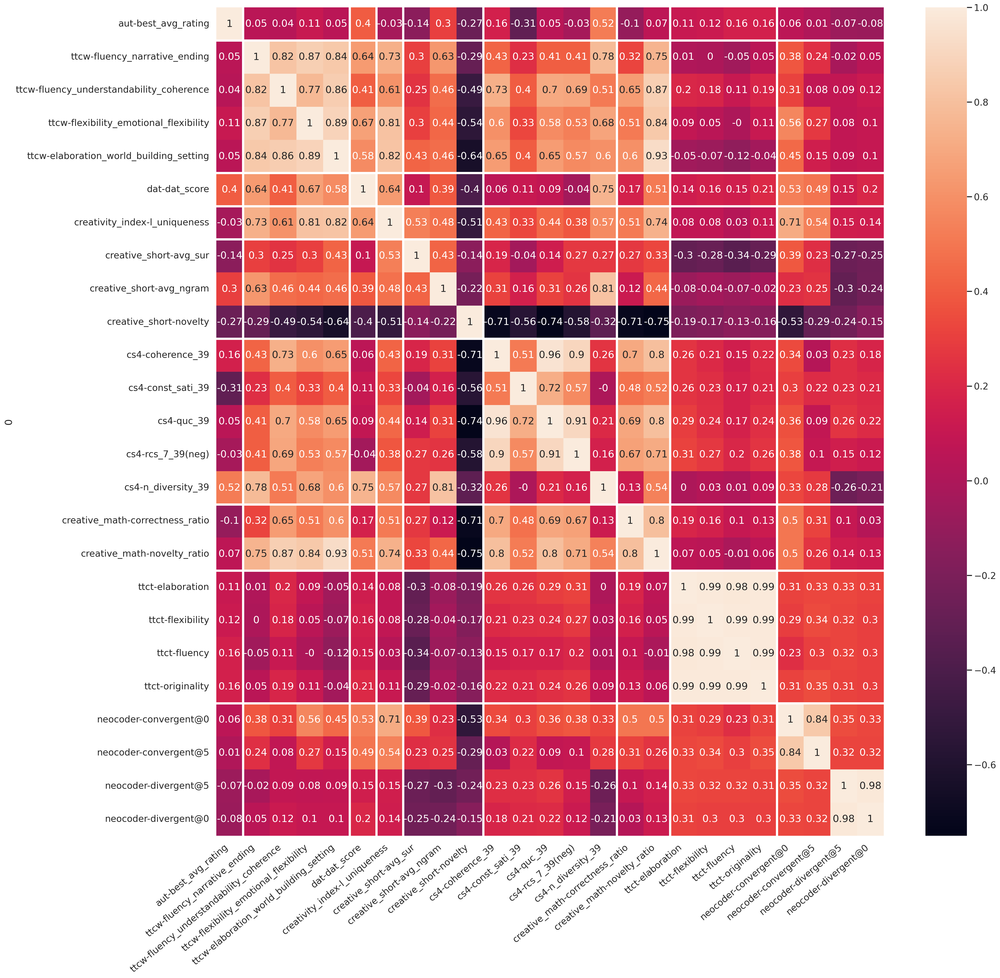

In [ ]:
# import matplotlib.pyplot as plt
fig, ax = plt.subplots(figsize=(27, 27))

sns.heatmap(all_corr_df, annot=True)
ax.set_xticklabels(ax.get_xticklabels(), rotation=40, ha="right")

for i in [1, 5, 6, 7, 10, 15, 17, 21]:
    ax.axvline(i, color="white", linestyle="solid", linewidth=4)
    ax.axhline(i, color="white", linestyle="solid", linewidth=4);

## 5.2 Groupby Taxonomy

In [ ]:
all_cols = []
renaming_map = {}
for k in group2metric:
    all_cols.extend(group2metric[k])
    for m in group2metric[k]:
        renaming_map[m] = k + '-' + m


tmp_result_df = results_df[all_cols].dropna().rename(columns = renaming_map)#.iloc[:13]
tmp_result_df

,diversity-ttcw-flexibility_emotional_flexibility,diversity-dat-dat_score,diversity-creative_short-avg_ngram,diversity-cs4-n_diversity_39,diversity-ttct-flexibility,novelty-aut-best_avg_rating,novelty-creativity_index-l_uniqueness,novelty-creative_short-avg_sur,novelty-creative_short-novelty,novelty-cs4-rcs_7_39(neg),...,quality-ttcw-fluency_narrative_ending,quality-ttcw-fluency_understandability_coherence,quality-ttcw-elaboration_world_building_setting,quality-cs4-coherence_39,quality-cs4-quc_39,quality-creative_math-correctness_ratio,quality-ttct-elaboration,quality-ttct-fluency,quality-neocoder-convergent@0,quality-neocoder-convergent@5
1,0,0.7908,0.81,0.8675,0.7757,0.718,0.4496,0.0889,0.0109,0.8947,...,0.17,0.08,0,0.8292,0.7048,0.2544,0.7861,0.766,0,0
2,0,0.6907,0.22,0.748,0.7842,0.602,0.4354,0.0834,0.0126,0.9143,...,0.08,0.17,0,0.7964,0.6451,0.7875,0.8073,0.7666,0.0202,0
3,0.17,0.8058,0.895,0.9032,0.7159,0.624,0.4810,0.0599,0.0163,0.8491,...,0.75,0.25,0.08,0.7097,0.5904,0.3711,0.7226,0.7024,0,0
4,0.08,0.8208,0.41,0.7808,0.7395,0.632,0.4724,0.049,0.0133,0.8103,...,0,0.08,0,0.7497,0.6193,0.5819,0.7831,0.7203,0.0051,0
5,0.25,0.8133,0.905,0.92,0.6455,0.69,0.4860,0.2043,0.0181,0.8595,...,0.67,0.33,0.08,0.7559,0.5543,0.5087,0.654,0.627,0.0051,0
6,0,0.6004,0.82,0.7978,0.7355,0.604,0.4752,0.1406,0.0151,0.9417,...,0.25,0.25,0,0.9262,0.7641,0.6899,0.7556,0.7064,0,0
7,0,0.6919,0.87,0.8604,0.7976,0.674,0.4663,0.1263,0.0082,0.9064,...,0,0.17,0,0.8718,0.7201,0.8972,0.8199,0.7727,0.0051,0
8,0,0.8298,0.715,0.8871,0.716,0.708,0.4149,0.0601,0.0109,0.8313,...,0.17,0.08,0,0.7856,0.5925,0.5697,0.7131,0.734,0.0253,0
9,0,0.694,0.545,0.7788,0.7904,0.69,0.4226,0.059,0.0109,0.9343,...,0,0.33,0,0.901,0.7392,0.8606,0.8339,0.7664,0.1515,0
10,0.08,0.7747,0.86,0.8484,0.8052,0.636,0.4133,0.1234,0.0101,0.9499,...,0.42,0.5,0.17,0.8964,0.7853,0.9042,0.822,0.7704,0,0


In [ ]:
# tmp_corr

In [ ]:
all_corr = []
all_unique_corr = {}
avg_corr = {}
for col in tmp_result_df.columns:
    tmp_corr = dict(tmp_result_df.corrwith(tmp_result_df[col]))
    tmp_corr_update = {}
    curr_task = col.split('-')[1]
    # for k in tmp_corr:
    #     if curr_task in k:
    #         tmp_corr[k] = 0.0
    avg_corr[col] = np.mean([tmp_corr[k] for k in tmp_corr if curr_task not in k])
    all_corr.append(tmp_corr)
    for m in tmp_corr:
        if (col, m) in all_unique_corr or col == m: continue
        all_unique_corr[(m, col)] = float(round(tmp_corr[m], 4))

all_corr_df = pd.DataFrame(all_corr, index = tmp_result_df.columns).round(2)
all_corr_df

,diversity-ttcw-flexibility_emotional_flexibility,diversity-dat-dat_score,diversity-creative_short-avg_ngram,diversity-cs4-n_diversity_39,diversity-ttct-flexibility,novelty-aut-best_avg_rating,novelty-creativity_index-l_uniqueness,novelty-creative_short-avg_sur,novelty-creative_short-novelty,novelty-cs4-rcs_7_39(neg),...,quality-ttcw-fluency_narrative_ending,quality-ttcw-fluency_understandability_coherence,quality-ttcw-elaboration_world_building_setting,quality-cs4-coherence_39,quality-cs4-quc_39,quality-creative_math-correctness_ratio,quality-ttct-elaboration,quality-ttct-fluency,quality-neocoder-convergent@0,quality-neocoder-convergent@5
0,,,,,,,,,,,,,,,,,,,,,
diversity-ttcw-flexibility_emotional_flexibility,1.00,0.67,0.44,0.68,0.05,0.11,0.81,0.30,-0.54,0.53,...,0.87,0.77,0.89,0.60,0.58,0.51,0.09,-0.00,0.56,0.27
diversity-dat-dat_score,0.67,1.00,0.39,0.75,0.16,0.40,0.64,0.10,-0.40,-0.04,...,0.64,0.41,0.58,0.06,0.09,0.17,0.14,0.15,0.53,0.49
diversity-creative_short-avg_ngram,0.44,0.39,1.00,0.81,-0.04,0.30,0.48,0.43,-0.22,0.26,...,0.63,0.46,0.46,0.31,0.31,0.12,-0.08,-0.07,0.23,0.25
diversity-cs4-n_diversity_39,0.68,0.75,0.81,1.00,0.03,0.52,0.57,0.27,-0.32,0.16,...,0.78,0.51,0.60,0.26,0.21,0.13,0.00,0.01,0.33,0.28
diversity-ttct-flexibility,0.05,0.16,-0.04,0.03,1.00,0.12,0.08,-0.28,-0.17,0.27,...,0.00,0.18,-0.07,0.21,0.24,0.16,0.99,0.99,0.29,0.34
novelty-aut-best_avg_rating,0.11,0.40,0.30,0.52,0.12,1.00,-0.03,-0.14,-0.27,-0.03,...,0.05,0.04,0.05,0.16,0.05,-0.10,0.11,0.16,0.06,0.01
novelty-creativity_index-l_uniqueness,0.81,0.64,0.48,0.57,0.08,-0.03,1.00,0.53,-0.51,0.38,...,0.73,0.61,0.82,0.43,0.44,0.51,0.08,0.03,0.71,0.54
novelty-creative_short-avg_sur,0.30,0.10,0.43,0.27,-0.28,-0.14,0.53,1.00,-0.14,0.27,...,0.30,0.25,0.43,0.19,0.14,0.27,-0.30,-0.34,0.39,0.23
novelty-creative_short-novelty,-0.54,-0.40,-0.22,-0.32,-0.17,-0.27,-0.51,-0.14,1.00,-0.58,...,-0.29,-0.49,-0.64,-0.71,-0.74,-0.71,-0.19,-0.13,-0.53,-0.29


In [ ]:
# sorted(avg_corr.items(), key = lambda x: x[1])

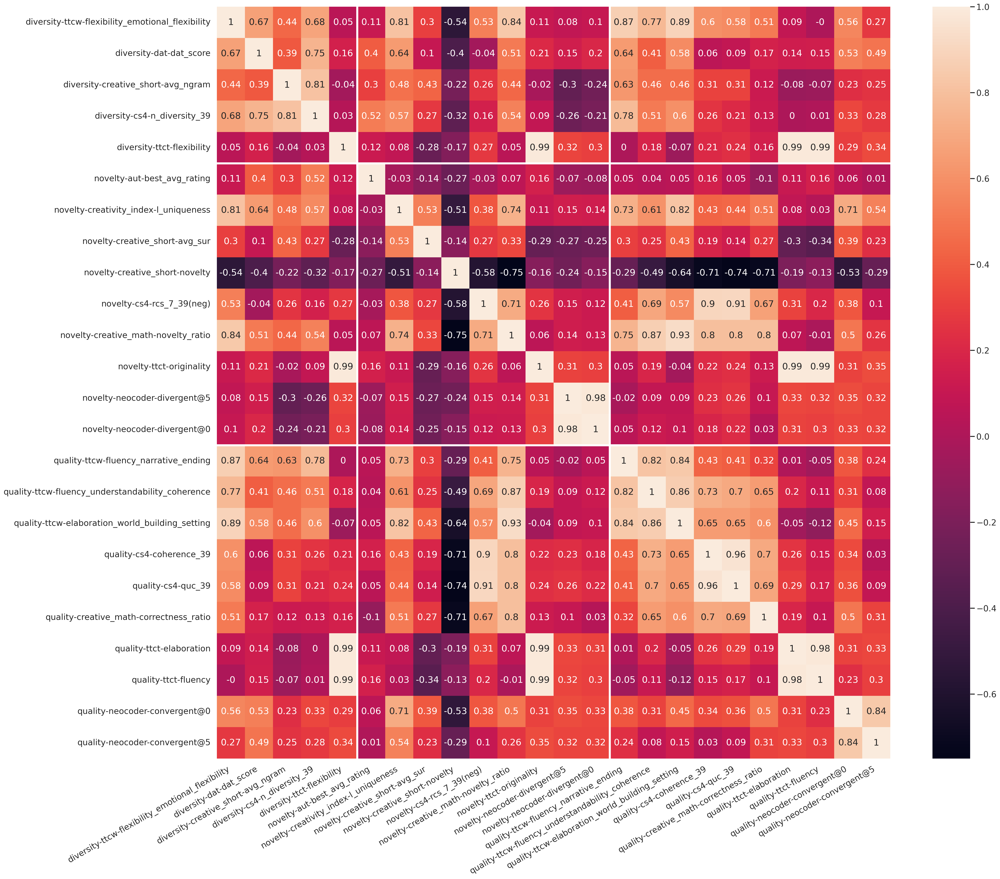

In [ ]:
fig, ax = plt.subplots(figsize=(30, 27))

sns.heatmap(all_corr_df, annot=True)
ax.set_xticklabels(ax.get_xticklabels(), rotation=30, ha="right")

ax.set_xlabel("")
ax.set_ylabel("")

ax.axvline(5, color="white", linestyle="solid", linewidth=4)
ax.axhline(5, color="white", linestyle="solid", linewidth=4)

ax.axvline(14, color="white", linestyle="solid", linewidth=4)
ax.axhline(14, color="white", linestyle="solid", linewidth=4)

In [ ]:
# sorted(all_unique_corr.items(), key = lambda x: x[1], reverse = True)[:10]

In [ ]:
# all_corr

# 6 Temperature

In [168]:
# col_lst
task2metric.keys()

dict_keys(['aut', 'creative_math', 'creative_short', 'creativity_index', 'cs4', 'dat', 'neocoder', 'ttct', 'ttcw'])

In [169]:
results_df = read_result_df('tmp_var')

exclude_tasks = [
    'neocoder',
    'creative_math',
    # "creativity_index",
    "dat"
    # "dat"
]
temperature_task_lst = [t for t in task2metric if t not in exclude_tasks]
temperature_metric_lst = [t for t in metric2task if metric2task[t] not in exclude_tasks]

col_lst = ['model'] + temperature_metric_lst
tmp_result_df = copy.deepcopy(results_df[col_lst].dropna())#.iloc[:13]

for col in temperature_metric_lst:
    tmp_result_df[col] = tmp_result_df[col].apply(convert_floats)
tmp_result_df['temperature'] = tmp_result_df['model'].apply(lambda x: int(x.split('-')[1]) / 100)
tmp_result_df['model_name'] = tmp_result_df['model'].apply(lambda x: x.split('-')[0])

tmp_result_df

,model,aut-best_avg_rating,ttcw-fluency_narrative_ending,ttcw-fluency_understandability_coherence,ttcw-flexibility_emotional_flexibility,ttcw-elaboration_world_building_setting,creativity_index-l_uniqueness,creative_short-avg_sur,creative_short-avg_ngram,creative_short-novelty,cs4-coherence_39,cs4-quc_39,cs4-rcs_7_39(neg),cs4-n_diversity_39,ttct-elaboration,ttct-flexibility,ttct-fluency,ttct-originality,temperature,model_name
20,olmo-000,0.644,0.75,0.25,0.00,0.00,0.3910,0.1854,0.885,0.0190,0.5385,0.2804,0.5207,0.9102,0.6324,0.6607,0.7083,0.6013,0.00,olmo
21,olmo-025,0.678,0.92,0.42,0.17,0.08,0.3848,0.2304,0.905,0.0209,0.4831,0.2305,0.4592,0.9060,0.6448,0.6628,0.6971,0.6061,0.25,olmo
22,olmo-050,0.638,0.75,0.42,0.42,0.00,0.4030,0.2197,0.915,0.0215,0.5851,0.3300,0.5785,0.9071,0.6492,0.6629,0.6734,0.6061,0.50,olmo
23,olmo-075,0.690,0.67,0.33,0.25,0.08,0.4211,0.2043,0.905,0.0181,0.7559,0.5543,0.8595,0.9200,0.6577,0.6543,0.6484,0.6144,0.75,olmo
24,olmo-100,0.646,1.00,0.75,0.42,0.25,0.4860,0.2281,0.935,0.0179,0.6790,0.4546,0.8396,0.9399,0.6540,0.6455,0.6270,0.6142,1.00,olmo
25,qwen-000,0.632,0.42,0.42,0.17,0.08,0.3318,0.1656,0.870,0.0091,0.9005,0.7744,0.9753,0.8227,0.8620,0.8349,0.8100,0.7467,0.00,qwen
26,qwen-025,0.586,0.67,0.58,0.00,0.17,0.3423,0.1721,0.885,0.0098,0.8913,0.7446,0.9379,0.8337,0.8705,0.8410,0.8118,0.7528,0.25,qwen
27,qwen-050,0.808,0.25,0.25,0.00,0.17,0.3498,0.1426,0.865,0.0105,0.8805,0.7438,0.9088,0.8438,0.8645,0.8366,0.8112,0.7462,0.50,qwen
28,qwen-075,0.636,0.42,0.50,0.08,0.17,0.3771,0.1234,0.860,0.0101,0.8964,0.7853,0.9499,0.8484,0.8610,0.8345,0.8021,0.7493,0.75,qwen
29,qwen-100,0.638,0.67,0.50,0.25,0.17,0.4133,0.1242,0.835,0.0079,0.8964,0.7664,0.9344,0.8617,0.8220,0.8052,0.7704,0.7301,1.00,qwen


In [170]:
grouped_by_task = group_by_task(
    tmp_result_df,
    sth2metric_dict = task2metric,
)

column_map = {
    'creative_short': "C-Short",
    'creativity_index': "C-Index",
    'aut': 'AUT',
    'ttct': "TTCT",
    # 'dat': 3,
    # 'creative_math': "C-Math",
    # 'neocoder': 5,
    'cs4': "CS4",
    'ttcw': "TTCW"
}


stacked_task_df = stack_data_for_sns(grouped_by_task, repeat_cols = ['model_name', 'temperature'], stack_cols = temperature_task_lst, stack_col_name = 'score', group_col_name = 'task')
stacked_task_df['task'] = stacked_task_df['task'].apply(
    lambda x: x if x not in column_map else column_map[x]
)
stacked_task_df['model-task'] = stacked_task_df.apply(lambda x:
    '{} ({})'.format(
        x['task'], x['model_name'][0].upper()
    )
, axis = 1)

In [171]:
task_num = {
    'AUT': 1,
    'TTCT': 2,
    # 'dat': 3,
    # 'creative_math': 4,
    # 'neocoder': 5,
    "C-Short": 6,
    'C-Index': 7,
    'CS4': 8,
    'TTCW': 9
}
stacked_task_df['task_num'] = stacked_task_df.task.apply(lambda x: task_num[x])
stacked_task_df = stacked_task_df.sort_values(by = 'task_num')

<ipython-input-173-e6a24f6676a0>:8: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.barplot(
<ipython-input-173-e6a24f6676a0>:8: UserWarning: The palette list has more values (17) than needed (5), which may not be intended.
  sns.barplot(


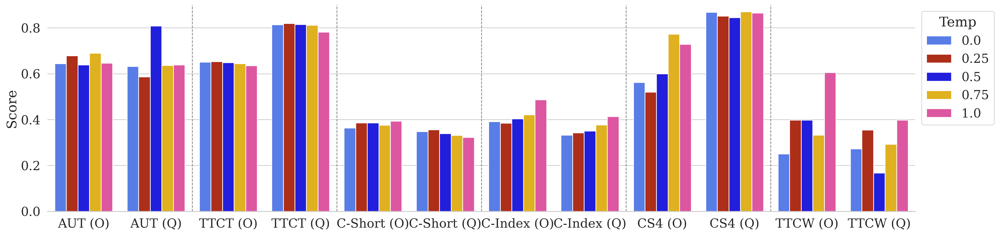

In [173]:
# stacked_df
# sns.set_theme(context="talk", style="whitegrid")
sns.set(font_scale=1.6)

sns.set_style('whitegrid', {'font.family':'serif', 'font.serif':"Computer Modern"})
fig, ax = plt.subplots(figsize=(20, 5))

sns.barplot(
    data=stacked_task_df,
    x="model-task",
    y="score",
    hue='temperature',
    hue_order=[0.00, 0.25, 0.50, 0.75, 1.00],
    palette=bar_plattee,
    dodge=True,
    ci=None,
    ax=ax,
)
plt.ylim(0, 0.9)

# divider_x = 3 * 2 - 0.5    # halfway after the 6th bar
for i in range(1, 6):
    ax.axvline(i * 2 - 0.5, color="gray", linestyle="--", linewidth=1)

# divider_x = len(group1) * len(model_order) - 0.5    # halfway after the 6th bar
# ax.axvline(divider_x, color="gray", linestyle="--", linewidth=1)


ax.set_xlabel("")
ax.set_ylabel("Score")
# ax.set_title("Scores by Task & Model (Temp‑coloured)", weight="bold")
# ax.set_xticklabels(ax.get_xticklabels(), rotation=40, ha="right")
ax.legend(title="Temp", frameon=True, bbox_to_anchor=(1, 1), loc="upper left")

sns.despine(left=True)
plt.tight_layout()
plt.show()

In [ ]:
# group2metric
# tmp_result_df

In [174]:
grouped_by_group = group_by_task(
    tmp_result_df,
    sth2metric_dict = group2metric,
)
stacked_group_df = stack_data_for_sns(
    grouped_by_group,
    repeat_cols = ['model_name', 'temperature'],
    stack_cols = group2metric.keys(),
    stack_col_name = 'score',
    group_col_name = 'group'
)
stacked_group_df['model-group'] = stacked_group_df.apply(lambda x: x["group"].capitalize() + ' (' + x['model_name'][0].upper() + ')', axis = 1)
stacked_group_df.head(10)

,model_name,temperature,score,group,model-group
0,olmo,0.00,0.613975,diversity,Diversity (O)
1,olmo,0.25,0.660950,diversity,Diversity (O)
2,olmo,0.50,0.726250,diversity,Diversity (O)
3,olmo,0.75,0.682325,diversity,Diversity (O)
4,olmo,1.00,0.735100,diversity,Diversity (O)
5,qwen,0.00,0.674400,diversity,Diversity (Q)
6,qwen,0.25,0.639925,diversity,Diversity (Q)
7,qwen,0.50,0.636350,diversity,Diversity (Q)
8,qwen,0.75,0.655725,diversity,Diversity (Q)
9,qwen,1.00,0.687975,diversity,Diversity (Q)


In [175]:
grouped_by_group.columns

Index(['model', 'aut-best_avg_rating', 'ttcw-fluency_narrative_ending',
       'ttcw-fluency_understandability_coherence',
       'ttcw-flexibility_emotional_flexibility',
       'ttcw-elaboration_world_building_setting',
       'creativity_index-l_uniqueness', 'creative_short-avg_sur',
       'creative_short-avg_ngram', 'creative_short-novelty',
       'cs4-coherence_39', 'cs4-quc_39', 'cs4-rcs_7_39(neg)',
       'cs4-n_diversity_39', 'ttct-elaboration', 'ttct-flexibility',
       'ttct-fluency', 'ttct-originality', 'temperature', 'model_name',
       'diversity', 'novelty', 'quality'],
      dtype='object', name=0)

<ipython-input-177-fb79ae421563>:10: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.barplot(
<ipython-input-177-fb79ae421563>:10: UserWarning: The palette list has more values (17) than needed (5), which may not be intended.
  sns.barplot(


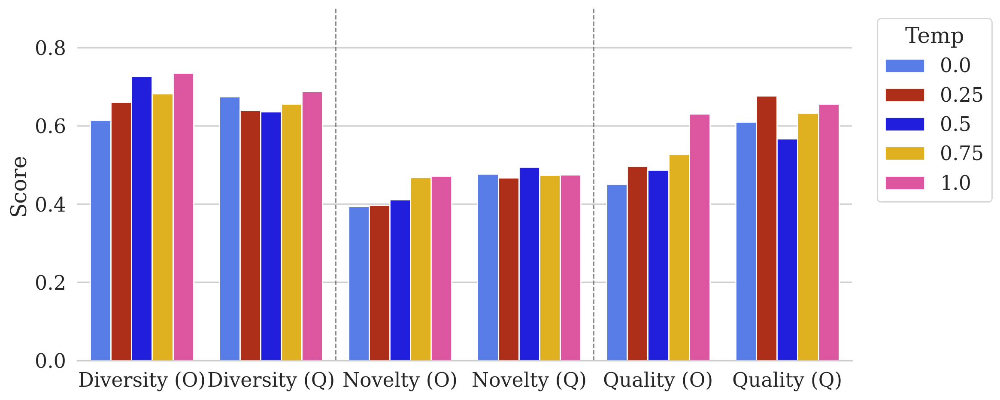

In [177]:
# stacked_df
# sns.set_theme(context="talk", style="whitegrid")
sns.set(font_scale=1.5)

sns.set_style('whitegrid', {'font.family':'serif', 'font.serif':"Computer Modern"})

fig, ax = plt.subplots(figsize=(12, 5))
plt.ylim(0, 0.9)

sns.barplot(
    data=stacked_group_df,
    x="model-group",
    y="score",
    hue='temperature',
    hue_order=[0.00, 0.25, 0.50, 0.75, 1.00],
    palette=bar_plattee,
    dodge=True,
    ci=None,
    ax=ax,
)

for i in range(1, 3):
    ax.axvline(i * 2 - 0.5, color="gray", linestyle="--", linewidth=1)

ax.set_xlabel("")
ax.set_ylabel("Score")
# ax.set_title("Scores by Task & Model (Temp‑coloured)", weight="bold")
# ax.set_xticklabels(ax.get_xticklabels(), rotation=40, ha="right")
ax.legend(title="Temp", frameon=True, bbox_to_anchor=(1.02, 1), loc="upper left")
sns.despine(left=True)
plt.tight_layout()
plt.show()

In [ ]:
# df = stacked_df

In [ ]:
# import seaborn as sns
# import matplotlib.pyplot as plt

# # ---------- Prep ----------------------------------------------------------
# df["task"]        = df["task"].astype("category")
# df["model_name"]       = df["model_name"].astype("category")
# df["temperature"] = df["temperature"].astype("category")

# # Build composite label once
# # df["Task_Model"] = df["Task"].astype(str) + "-" + df["Model"]
# df["Task_Model"] = df.apply(lambda row: "{} ({})".format(row["task"], row["model_name"]), axis = 1)

# # --- Define the two clusters you want on the x‑axis -----------------------
# group1 = ["aut", "ttct", "dat"]                     # first cluster
# group2 = ["creativity_index", "cs4", "creative_short", "ttcw"]  # second

# model_order = ["qwen", "olmo"]                      # inner order is qwen → olmo

# # Construct the full order: (g1‑qwen, g1‑olmo, …, g2‑qwen, g2‑olmo)
# x_order = [
#     f"{task} ({model})"
#     for task in group1 + group2
#     for model in model_order
# ]

# df["Task_Model"] = (
#     df["Task_Model"]
#       .astype("category")
#       .cat.reorder_categories(x_order, ordered=True)
# )

# # ---------- Plot ----------------------------------------------------------
# sns.set_theme(context="talk", style="whitegrid")
# fig, ax = plt.subplots(figsize=(22, 8))             # wide canvas

# sns.barplot(
#     data=df,
#     x="Task_Model",
#     y="score",
#     hue="temperature",
#     hue_order=[0, .25, .50, .75, 1],
#     palette=bar_plattee,
#     dodge=True,
#     ci=None,
#     ax=ax,
# )

# # ---------- Dash divider between the two clusters -------------------------
# # group1 has len(group1) * len(model_order) bars  → 3 * 2 = 6
# divider_x = len(group1) * len(model_order) - 0.5    # halfway after the 6th bar
# ax.axvline(divider_x, color="gray", linestyle="--", linewidth=1)

# # ---------- Cosmetics -----------------------------------------------------
# ax.set_xlabel("")
# ax.set_ylabel("Score")
# ax.set_title("Scores by Task & Model (Temp‑coloured)", weight="bold")
# ax.set_xticklabels(ax.get_xticklabels(), rotation=40, ha="right")
# ax.legend(title="Temp", frameon=False, bbox_to_anchor=(1.02, 1), loc="upper left")
# sns.despine(left=True)
# plt.tight_layout()
# plt.show()


In [ ]:
# divider_x

# 7 SFT v.s. DPO

In [178]:
results_df = read_result_df('sft')
exclude_tasks = ['creative_math', 'creativity_index']
task_lst = [t for t in metric2task if t not in exclude_tasks]
print(task_lst)
# task_lst = [t+'-' for t in task_lst]
exclude_lst = [
    'creative_short-avg_3_gram'
]

col_lst = ['model'] + task_lst


tmp_result_df = copy.deepcopy(results_df[col_lst].dropna())
for col in task_lst:
    tmp_result_df[col] = tmp_result_df[col].apply(convert_floats)
# .astype('float')#.iloc[:13]
# tmp_result_df = tmp_result_df.loc[tmp_result_df]
tmp_result_df['setting'] = tmp_result_df['model'].apply(lambda x: x.split('-')[1].upper())

tmp_result_df

['aut-best_avg_rating', 'ttcw-fluency_narrative_ending', 'ttcw-fluency_understandability_coherence', 'ttcw-flexibility_emotional_flexibility', 'ttcw-elaboration_world_building_setting', 'dat-dat_score', 'creativity_index-l_uniqueness', 'creative_short-avg_sur', 'creative_short-avg_ngram', 'creative_short-novelty', 'cs4-coherence_39', 'cs4-quc_39', 'cs4-rcs_7_39(neg)', 'cs4-n_diversity_39', 'creative_math-correctness_ratio', 'creative_math-novelty_ratio', 'ttct-elaboration', 'ttct-flexibility', 'ttct-fluency', 'ttct-originality', 'neocoder-convergent@0', 'neocoder-convergent@5', 'neocoder-divergent@5', 'neocoder-divergent@0']


,model,aut-best_avg_rating,ttcw-fluency_narrative_ending,ttcw-fluency_understandability_coherence,ttcw-flexibility_emotional_flexibility,ttcw-elaboration_world_building_setting,dat-dat_score,creativity_index-l_uniqueness,creative_short-avg_sur,creative_short-avg_ngram,...,creative_math-novelty_ratio,ttct-elaboration,ttct-flexibility,ttct-fluency,ttct-originality,neocoder-convergent@0,neocoder-convergent@5,neocoder-divergent@5,neocoder-divergent@0,setting
31,olmo-sft,0.584,0.42,0.17,0.42,0.08,0.7533,0.3345,0.1945,0.875,...,0.050,0.4659,0.4594,0.4616,0.4577,0.0000,0.0,0.13402,0.2071,SFT
32,olmo-dpo,0.674,0.83,0.58,0.25,0.08,0.7944,0.4159,0.1700,0.880,...,0.090,0.6554,0.6416,0.6186,0.6172,0.0000,0.0,0.52580,0.5808,DPO
33,olmo-instruct,0.690,0.67,0.33,0.25,0.08,0.8133,0.4211,0.2043,0.905,...,0.115,0.6540,0.6455,0.6270,0.6142,0.0051,0.0,0.44330,0.5303,INSTRUCT


In [179]:
# tmp_result_df
# task2metric

<ipython-input-181-34aa09ecc18d>:34: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.barplot(
<ipython-input-181-34aa09ecc18d>:34: UserWarning: The palette list has more values (17) than needed (3), which may not be intended.
  sns.barplot(


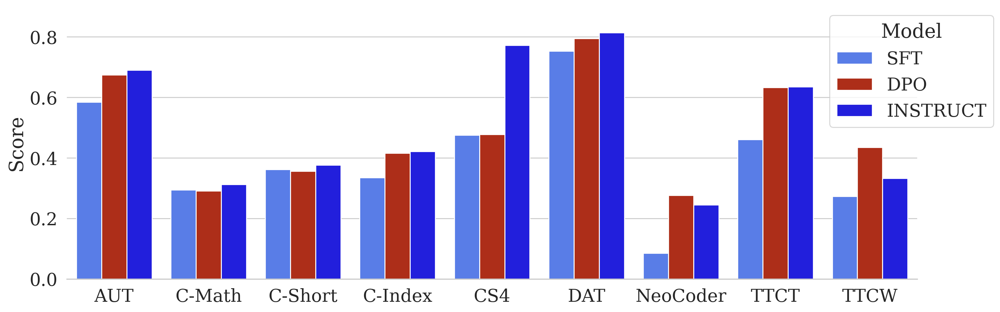

In [181]:
grouped_data = group_by_task(tmp_result_df, task2metric)
stacked_df = stack_data_for_sns(
    grouped_data,
    repeat_cols = ['model'] + ['setting'],
    stack_cols = list(task2metric.keys()),
    stack_col_name = 'score',
    group_col_name = 'task'
)

column_map = {
    'creative_short': "C-Short",
    'creativity_index': "C-Index",
    'aut': 'AUT',
    'ttct': "TTCT",
    'dat': "DAT",
    'creative_math': "C-Math",
    'neocoder': "NeoCoder",
    'cs4': "CS4",
    'ttcw': "TTCW"
}
stacked_df['task'] = stacked_df['task'].apply(
    lambda x: x if x not in column_map else column_map[x]
)

# stacked_df
# sns.set_theme(context="talk", style="whitegrid")
sns.set(font_scale=1.7)
sns.set_style('whitegrid', {'font.family':'serif', 'font.serif':"Computer Modern"})


fig, ax = plt.subplots(figsize=(15, 5))
plt.ylim(0, 0.9)

sns.barplot(
    data=stacked_df,
    x="task",
    y="score",
    hue='setting',
    hue_order=["SFT", "DPO", "INSTRUCT"],
    palette=bar_plattee,
    dodge=True,
    ci=None,
    ax=ax,
)

ax.set_xlabel("")
ax.set_ylabel("Score")
# ax.set_title("Avg. Scores by Task", weight="bold")
# ax.set_xticklabels(ax.get_xticklabels(), rotation=40, ha="right")
ax.legend(title="Model", frameon=True, bbox_to_anchor=(1.1, 1), loc="upper right")
sns.despine(left=True)
plt.tight_layout()
plt.show()

<ipython-input-183-d4653a08819b>:19: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.barplot(
<ipython-input-183-d4653a08819b>:19: UserWarning: The palette list has more values (17) than needed (3), which may not be intended.
  sns.barplot(


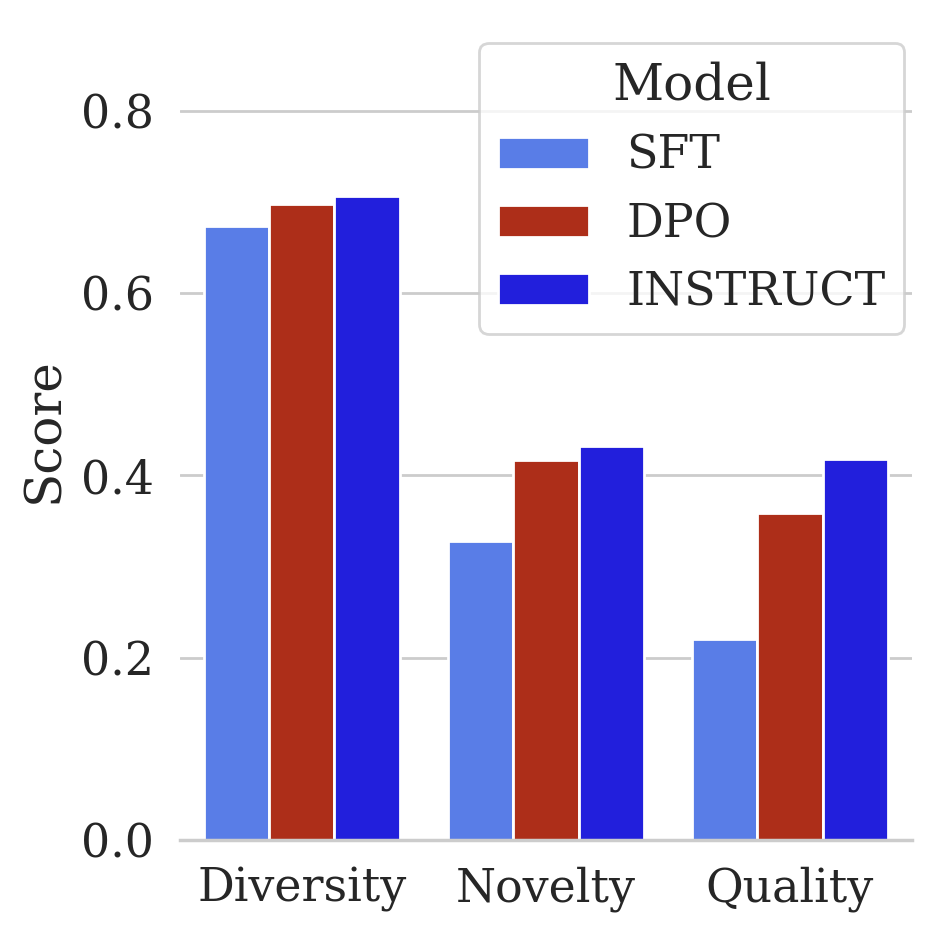

In [183]:
grouped_data = group_by_task(tmp_result_df, group2metric)
stacked_df = stack_data_for_sns(
    grouped_data,
    repeat_cols = ['model'] + ['setting'],
    stack_cols = list(group2metric.keys()),
    stack_col_name = 'score',
    group_col_name = 'task'
)
# stacked_df
stacked_df['task'] = stacked_df['task'].apply(lambda x: x.capitalize())

# sns.set_theme(context="talk", style="whitegrid")
sns.set(font_scale=1.5)
sns.set_style('whitegrid', {'font.family':'serif', 'font.serif':"Computer Modern"})

fig, ax = plt.subplots(figsize=(5, 5))
plt.ylim(0, 0.9)

sns.barplot(
    data=stacked_df,
    x="task",
    y="score",
    hue='setting',
    hue_order=["SFT", "DPO", "INSTRUCT"],
    palette=bar_plattee,
    dodge=True,
    ci=None,
    ax=ax,
)

ax.set_xlabel("")
ax.set_ylabel("Score")
# ax.set_title("Avg. Scores by Creativity Dimension", weight="bold")
# ax.set_xticklabels(ax.get_xticklabels(), rotation=40, ha="right")
ax.legend(title="Model", frameon=True, bbox_to_anchor=(1.02, 1), loc="upper right")
sns.despine(left=True)
plt.tight_layout()
plt.show()

In [ ]:
stacked_df

# 8 Overleaf Tables

In [ ]:
task_lst = [
    'ttcw',
    # 'aut',
    # 'creativity_index',
    # 'creative_short',
    # 'dat',
    # 'cs4'
]

col_lst = ['model', 'Size', 'Family']
# col_lst = []
for col in results_df.columns:
    for t in task_lst:
        if t in col:
            col_lst.append(col)
            break
col_lst

In [ ]:
tmp_result_df = results_df[col_lst].dropna()#.iloc[:13]
tmp_result_df

In [ ]:
for i, row in tmp_result_df.iterrows():
    row_str = ''
    for col in tmp_result_df.columns:
        row_str += row[col] + ' & '
    print(row_str)